<a href="https://colab.research.google.com/github/alpolo1991/analisis_de_datos_G77/blob/main/ArbolesdeDecision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
# @title Versión de Python

# python3 -m pip list
# python3 -m pip freeze > requirements.txt
!python --version

Python 3.10.12


In [2]:
# Importar bibliotecas
import pandas as pd # Cargar y manipular el dataset.
import numpy as np # Realizar cálculos numéricos.
import matplotlib.pyplot as plt # Para la visualización de datos.
import seaborn as sns # Para la visualización de datos.
import plotly.express as px # Para la visualización de datos.
# import plotly.graph_objects as go # Para la visualización de datos.

# # Importa la función para calcular métricas de evaluación
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, roc_auc_score, mean_squared_error, mean_absolute_error, auc, roc_curve # r2_score, precision_score, recall_score, f1_score

# # train_test_split: Importa la función para dividir datos en conjuntos de entrenamiento y prueba.
from sklearn.model_selection import train_test_split, cross_val_score, KFold

##Model Evaluations
from sklearn.linear_model import LogisticRegression #, LinearRegression, Lasso, LassoCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
# from sklearn.ensemble import GradientBoostingClassifier
# from xgboost import XGBClassifier
# from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
# from sklearn.neural_network import MLPClassifier

In [4]:
# @title Warnings

import warnings

warnings.filterwarnings('ignore')

# Definición del Problema y Objetivos:

# Recopilación de Datos:

## Identificar fuentes:

- Bases de datos, archivos, APIs, encuestas, etc.


## Extraer datos:

- Obtener los datos de las fuentes y almacenarlos en un formato adecuado (CSV, Excel, bases de datos relacionales).

In [5]:
# @title Carga de datos

file_name = 'winequality-red.csv'

df_winequality_red_csv = pd.read_csv(file_name, delimiter=',')

# Limpieza y Preparación de Datos:

## Manejar valores faltantes:

- Eliminar registros, imputar valores (media, mediana, moda, imputación por modelos).

## Corregir inconsistencias:

- Identificar y corregir errores, duplicados, valores fuera de rango.

## Transformar datos:

- Normalizar, estandarizar, discretizar, crear nuevas variables, codificar variables categóricas.

## Reducir dimensionalidad:

- PCA, t-SNE, selección de características.

Variables de entrada (basadas en pruebas fisicoquímicas):

1. - acidez fija
2. - acidez volátil
3. - ácido cítrico
4. - azúcar residual
5. - cloruros
6. - dióxido de azufre libre
7. - dióxido de azufre total
8. - densidad
9. - pH
10. - sulfatos
11. - alcohol

Variable de salida (basada en datos sensoriales):

12. - calidad (puntuación entre 0 y 10)

In [6]:
# @title Infomacion básica del dataset cargado.

df_winequality_red_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [7]:
# @title Mostramos las primeras 15 filas.

df_winequality_red_csv.head(15)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [8]:
# @title Nombre de columnas y cantidad de filas y columnas.
name_columns = {
    'fixed acidity': 'acidez fija',
    'volatile acidity': 'acidez volátil',
    'citric acid': 'ácido cítrico',
    'residual sugar': 'azúcar residual',
    'chlorides': 'cloruros',
    'free sulfur dioxide': 'dioxido de azufre libre',
    'total sulfur dioxide': 'dioxido de azufre total',
    'density': 'densidad',
    'pH': 'pH',
    'sulphates': 'sulfatos',
    'alcohol': 'alcohol',
    'quality': 'calidad'
}

def rename_columns(name_col, df):
  for key, value in name_col.items():
    df.rename(columns={key: value}, inplace=True)

rename_columns(name_columns, df_winequality_red_csv)

print(df_winequality_red_csv.shape)
print(df_winequality_red_csv.columns.values.tolist())

(1599, 12)
['acidez fija', 'acidez volátil', 'ácido cítrico', 'azúcar residual', 'cloruros', 'dioxido de azufre libre', 'dioxido de azufre total', 'densidad', 'pH', 'sulfatos', 'alcohol', 'calidad']


In [9]:
# @title Validamos si cuenta con valores faltantes

print("Valores faltantes: ")
print(df_winequality_red_csv.isnull().sum())

Valores faltantes: 
acidez fija                0
acidez volátil             0
ácido cítrico              0
azúcar residual            0
cloruros                   0
dioxido de azufre libre    0
dioxido de azufre total    0
densidad                   0
pH                         0
sulfatos                   0
alcohol                    0
calidad                    0
dtype: int64


In [10]:
# @title Todos los datos con estadistica descritiva

df_winequality_red_csv.describe()

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [11]:
# @title Eliminamos valores faltantes en caso que los halla

print("Cantidad de filas antes de eliminar valores nulos: ", len(df_winequality_red_csv))
df_winequality_red_csv = df_winequality_red_csv.dropna()
print("Cantidad de filas después de eliminar valores nulos: ", len(df_winequality_red_csv))

Cantidad de filas antes de eliminar valores nulos:  1599
Cantidad de filas después de eliminar valores nulos:  1599


In [12]:
# @title Revisamos si existe valores duplicados

print("Valores duplicados: ")
print(df_winequality_red_csv.duplicated().sum())

Valores duplicados: 
240


In [13]:
# @title Si hay valores duplicados los mostramos

df_winequality_red_csv[df_winequality_red_csv.duplicated()]
# df_winequality_red_csv[df_winequality_red_csv.duplicated].shape

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [14]:
# @title Si hay valores duplicados los eliminamos

print("Cantidad de filas antes de eliminar valores duplicados: ", len(df_winequality_red_csv))
df_winequality_red_csv.drop_duplicates(inplace=True)
print("Cantidad de filas después de eliminar valores duplicados: ", len(df_winequality_red_csv))

Cantidad de filas antes de eliminar valores duplicados:  1599
Cantidad de filas después de eliminar valores duplicados:  1359


In [15]:
# @title Revisamos si existe valores duplicados

print("Valores duplicados: ")
print(df_winequality_red_csv.duplicated().sum())

Valores duplicados: 
0


In [16]:
# @title Todos los datos con estadistica descritiva

df_winequality_red_csv.describe()

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [17]:
# @title Mostramos las primeras 15 filas.

df_winequality_red_csv.head(20)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5
10,6.7,0.580,0.08,1.8,0.097,15.0,65.0,0.9959,3.28,0.54,9.2,5


In [21]:
# @title Contar si hay valores ceros en cada columna

print((df_winequality_red_csv == 0).sum())

acidez fija                  0
acidez volátil               0
ácido cítrico              118
azúcar residual              0
cloruros                     0
dioxido de azufre libre      0
dioxido de azufre total      0
densidad                     0
pH                           0
sulfatos                     0
alcohol                      0
calidad                      0
dtype: int64


In [18]:
# @title La columna ácido cítrico mostrar valores con ceros y valors que son mayores a ceros

print(df_winequality_red_csv['ácido cítrico'].value_counts())

ácido cítrico
0.00    118
0.49     59
0.24     41
0.02     38
0.08     32
       ... 
0.72      1
0.62      1
0.71      1
0.79      1
0.78      1
Name: count, Length: 80, dtype: int64


In [20]:
# @title Agregar la media a la columna ácido cítrico que cuenten con valores iguales a ceros.

df_winequality_red_csv['ácido cítrico'] = df_winequality_red_csv['ácido cítrico'].replace(0, df_winequality_red_csv['ácido cítrico'].mean())

In [21]:
# @title Convertir datos de la columna ácido cítrico a dos decimales

df_winequality_red_csv['ácido cítrico'] = df_winequality_red_csv['ácido cítrico'].apply(lambda x: round(x, 2))

In [22]:
# @title La columna ácido cítrico mostrar valores con ceros y valors que son mayores a ceros

print(df_winequality_red_csv['ácido cítrico'].value_counts())

ácido cítrico
0.27    133
0.49     59
0.24     41
0.02     38
0.08     32
       ... 
0.72      1
0.62      1
0.75      1
1.00      1
0.78      1
Name: count, Length: 79, dtype: int64


In [23]:
# @title Mostramos las primeras 15 filas.

df_winequality_red_csv.head(10)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
0,7.4,0.70,0.27,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.27,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.27,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.27,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5
10,6.7,0.58,0.08,1.8,0.097,15.0,65.0,0.9959,3.28,0.54,9.2,5


In [24]:
# @title Datos estadisticos de la columna ácido cítrico

df_winequality_red_csv['ácido cítrico'].describe(percentiles=[0.25, 0.5, 0.75, 0.9])

,ácido cítrico
count,1359.000000
mean,0.295776
std,0.176750
min,0.010000
25%,0.160000
50%,0.270000
75%,0.430000
90%,0.530000
max,1.000000


In [28]:
# @title Normalizar datos con MinMaxScaler

# from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler()

# df_winequality_red_normalizar = scaler.fit_transform(df_winequality_red_csv)
# df_winequality_red_normalizar

# df_winequality_red_normalizar = (df_winequality_red_csv - df_winequality_red_csv.mean()) / df_winequality_red_csv.std()
# df_winequality_red_normalizar

# Exploración de Datos (EDA):

## Visualización:

- Histogramas, diagramas de caja, gráficos de dispersión, matrices de correlación, gráficos de barras.

## Estadísticas descriptivas:

- Media, mediana, moda, desviación estándar, cuartiles, correlación.

## Análisis univariado y bivariado:

- Analizar cada variable individualmente y las relaciones entre pares de variables.

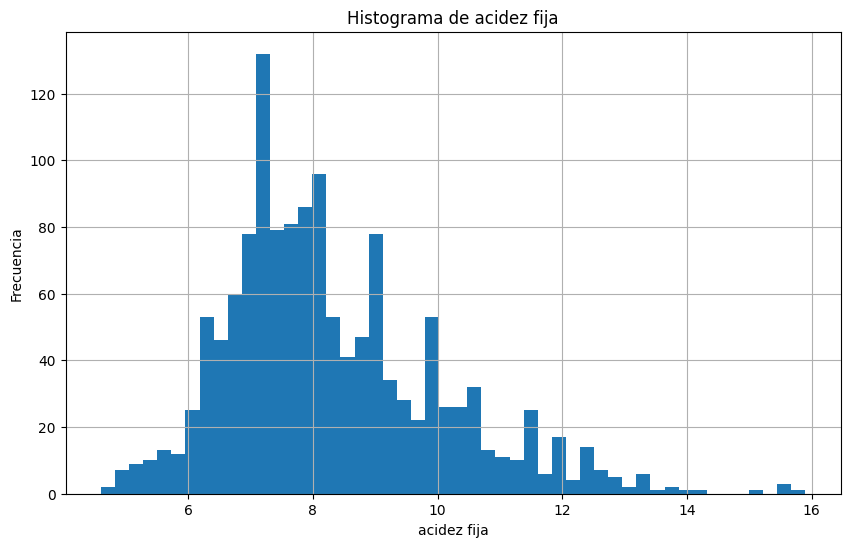

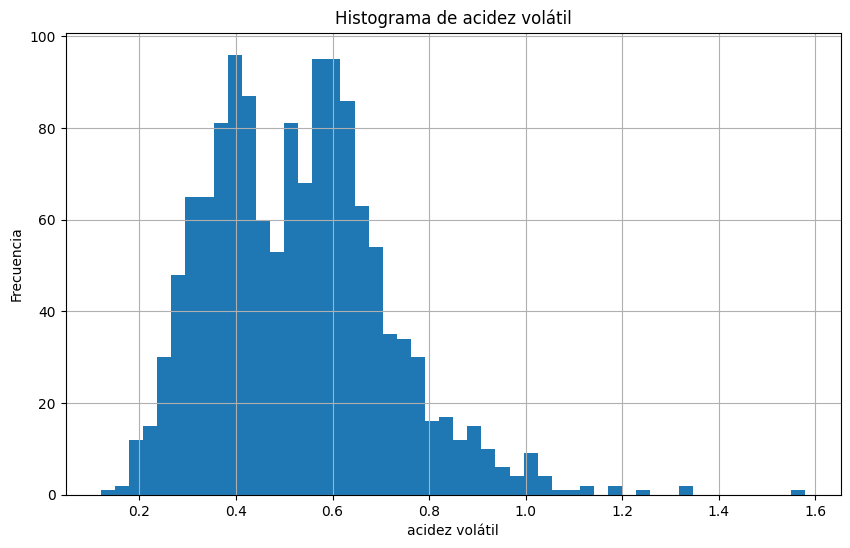

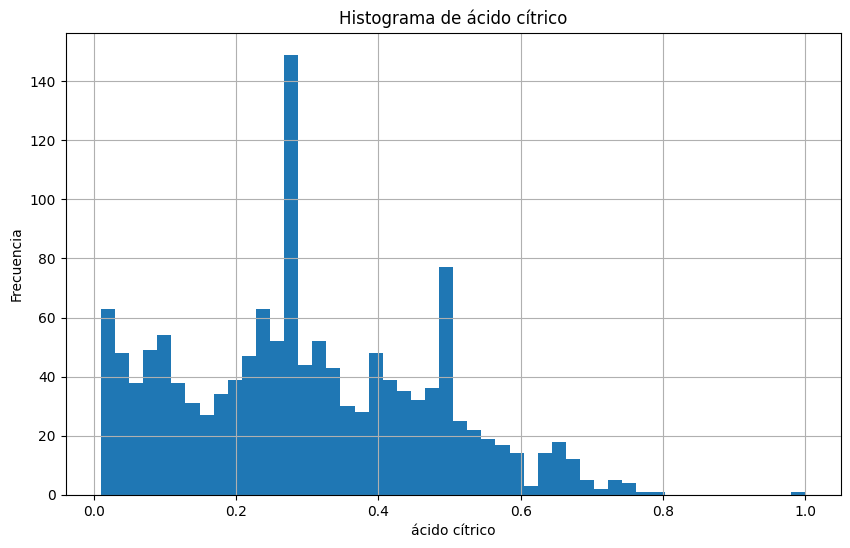

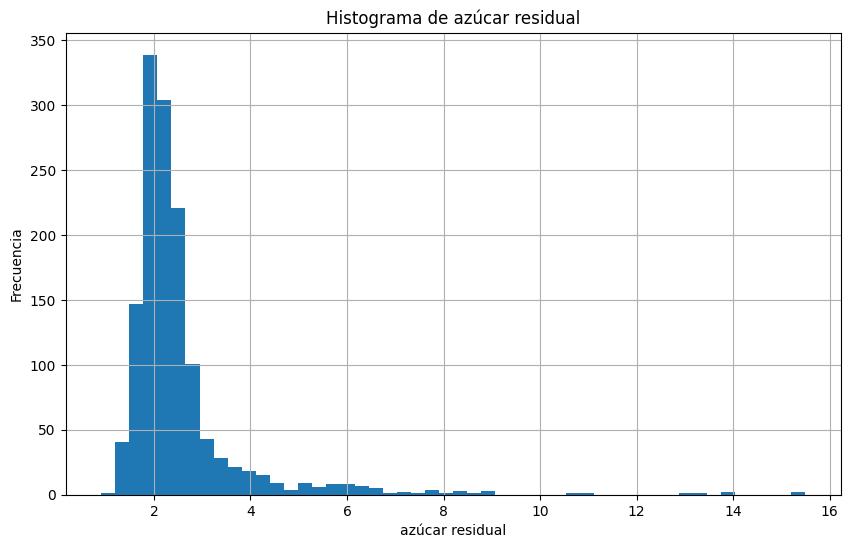

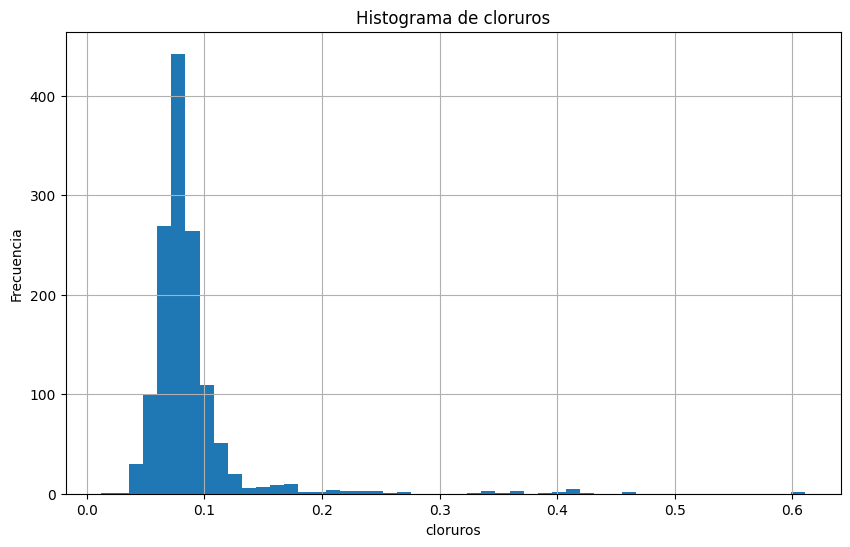

...

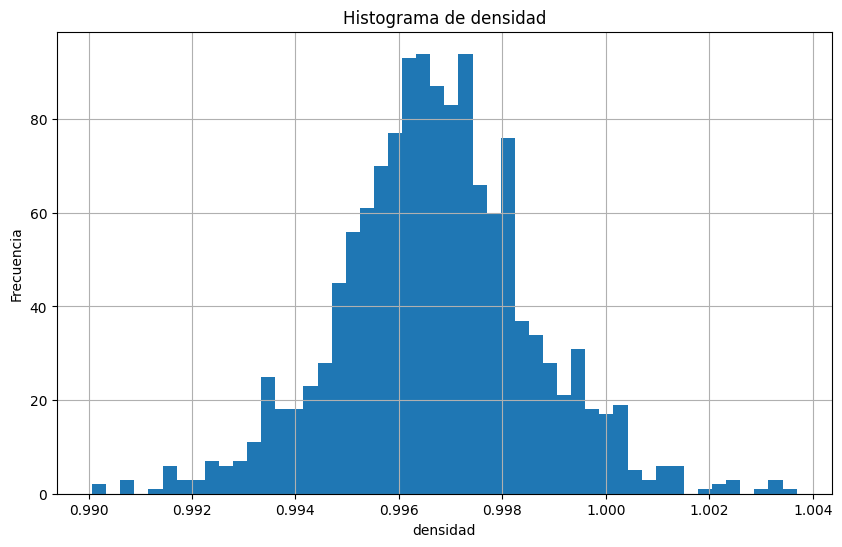

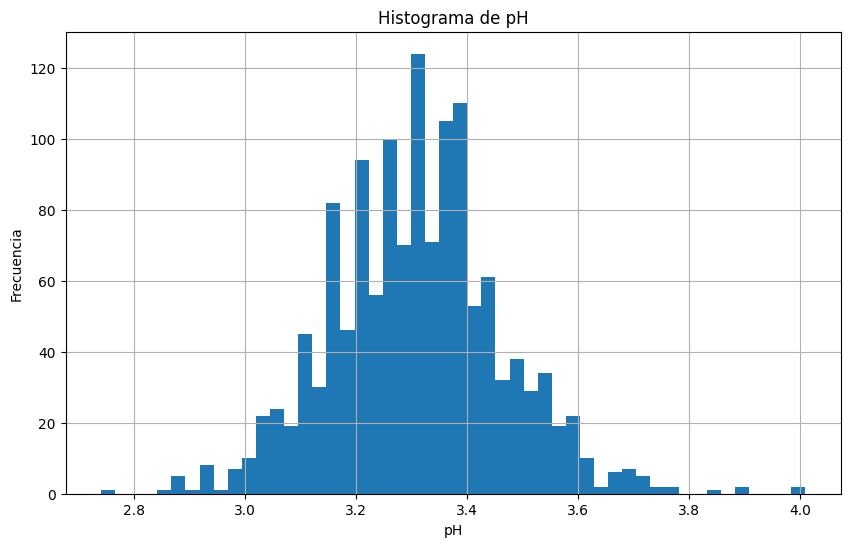

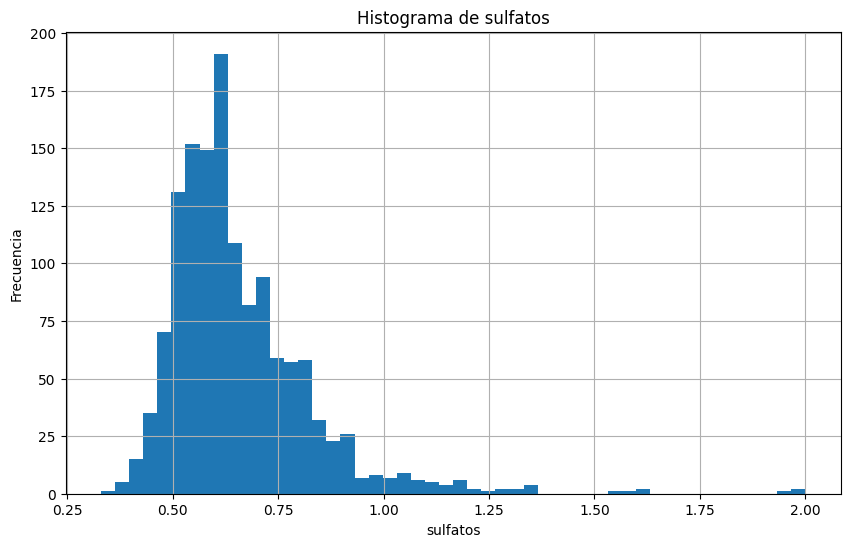

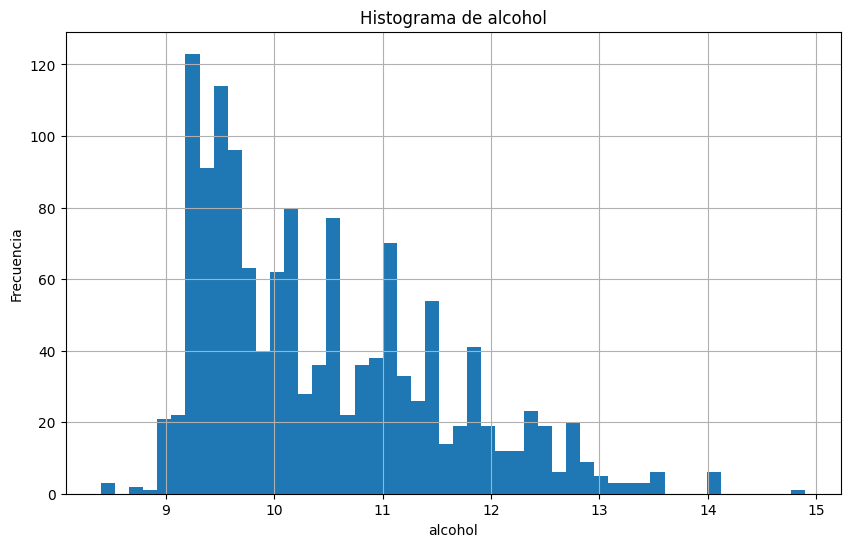

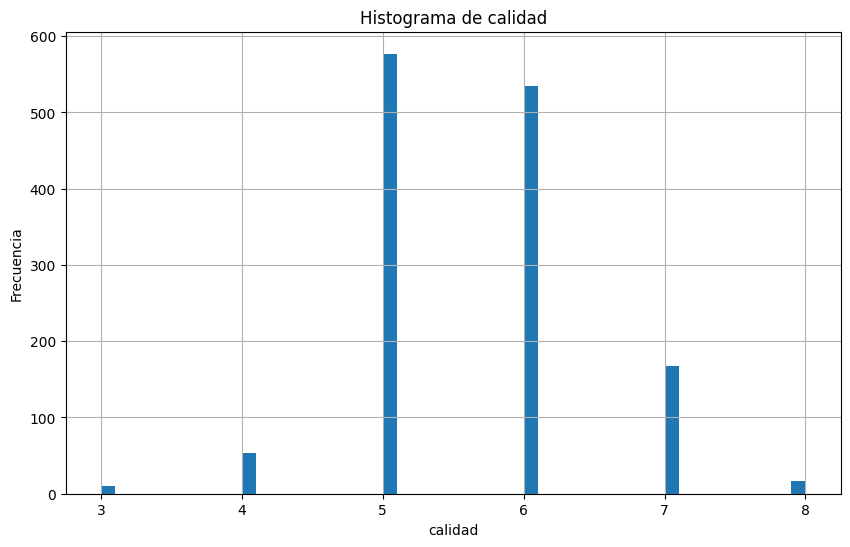

In [29]:
# @title Histograma de todo el datasets

def hist(df, columns):
  for column in columns:
    df.hist(column, bins=50, figsize=(10,6))
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
    plt.title(f'Histograma de {column}')
    plt.show()

# df_winequality_red_csv.hist(bins=50, figsize=(10,6))
# plt.show()

hist(df_winequality_red_csv, df_winequality_red_csv.columns)

# features = ['fixed acidity', 'volatile acidity', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']

# features_heart_cleveland = df_winequality_red_csv.select_dtypes(exclude=['object'])
# features_heart_cleveland.drop('calidad', axis=1, inplace=True)

# for feature in features_heart_cleveland:
#   plt.figure(figsize = (10,6))
#   sns.histplot(df_winequality_red_csv[feature], bins = 30, kde = True)
#   plt.title(f"Histogram of {feature}")
#   plt.show()

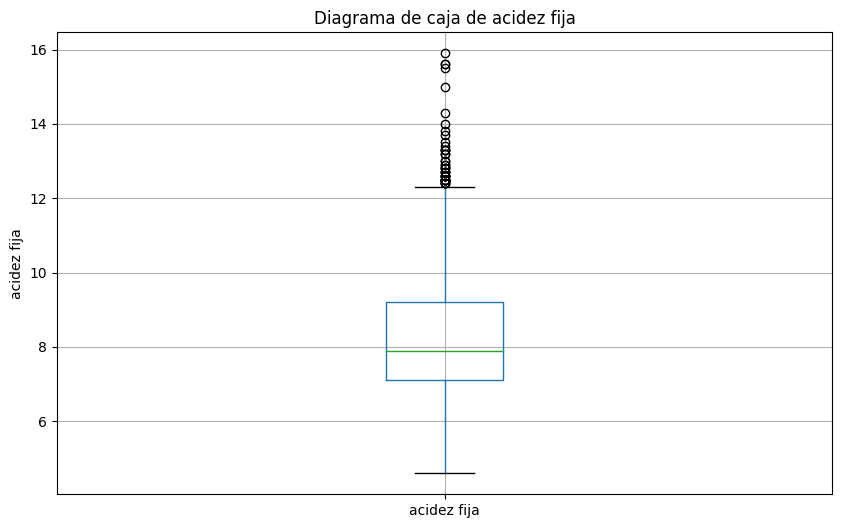

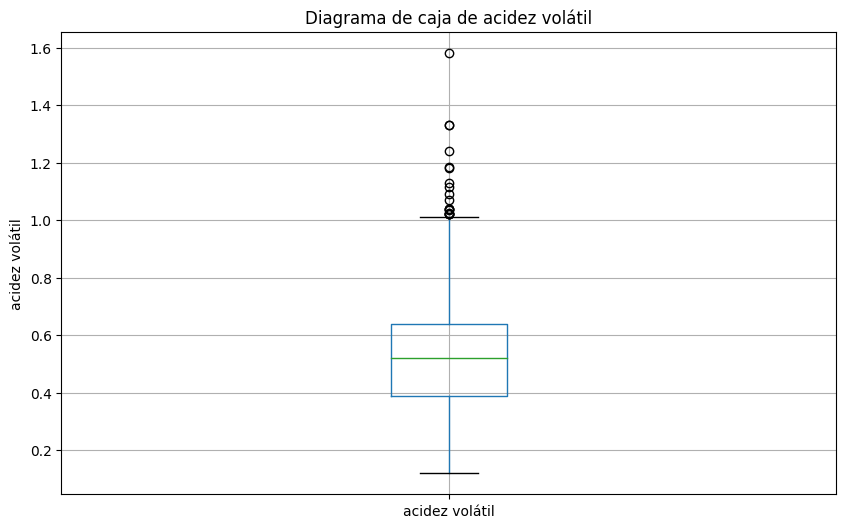

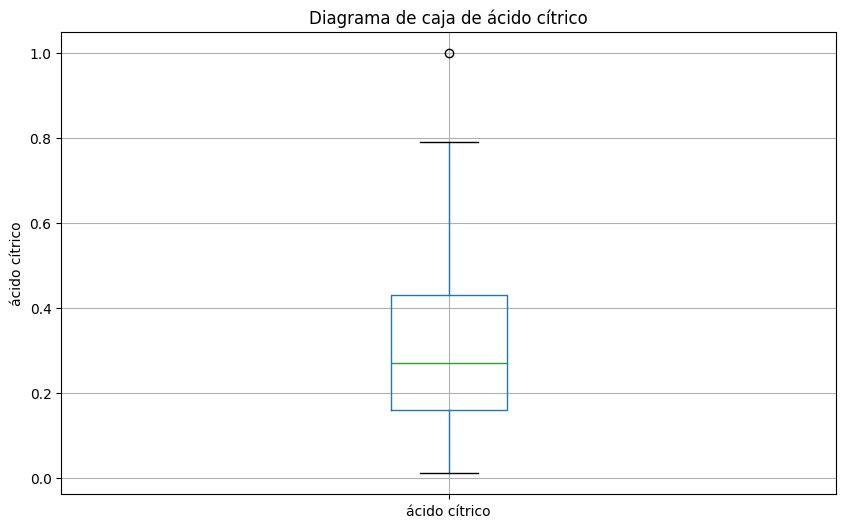

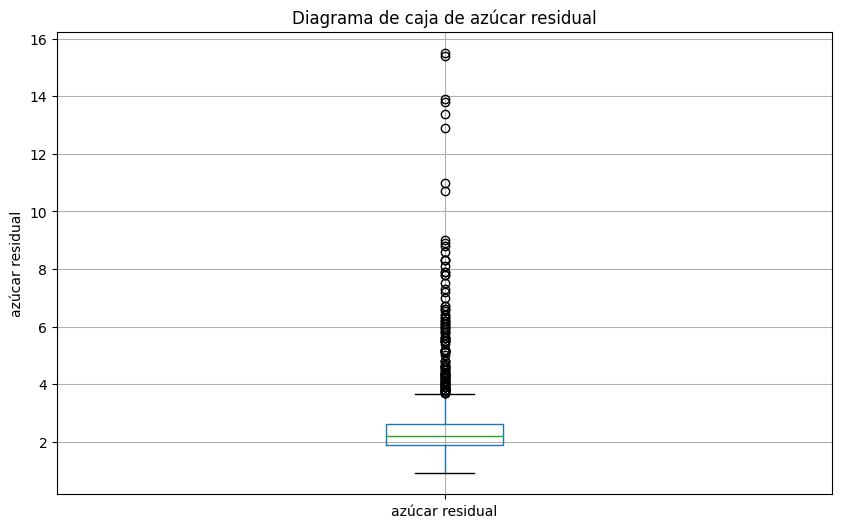

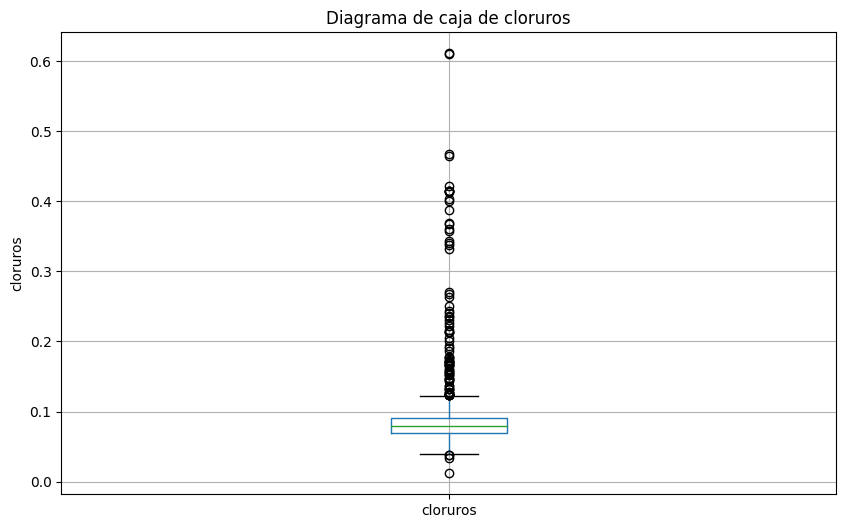

...

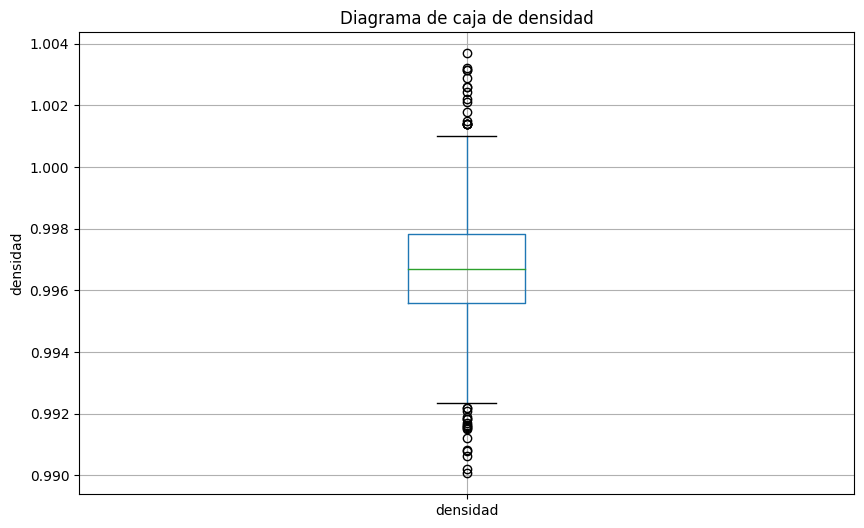

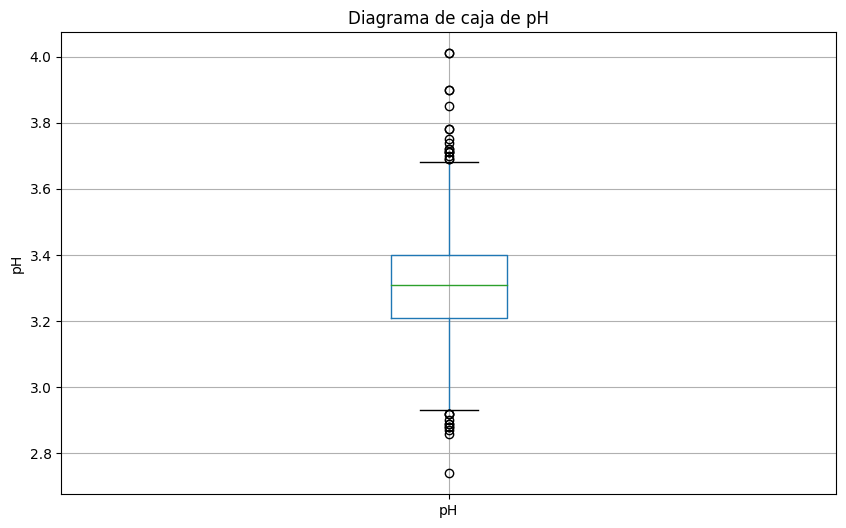

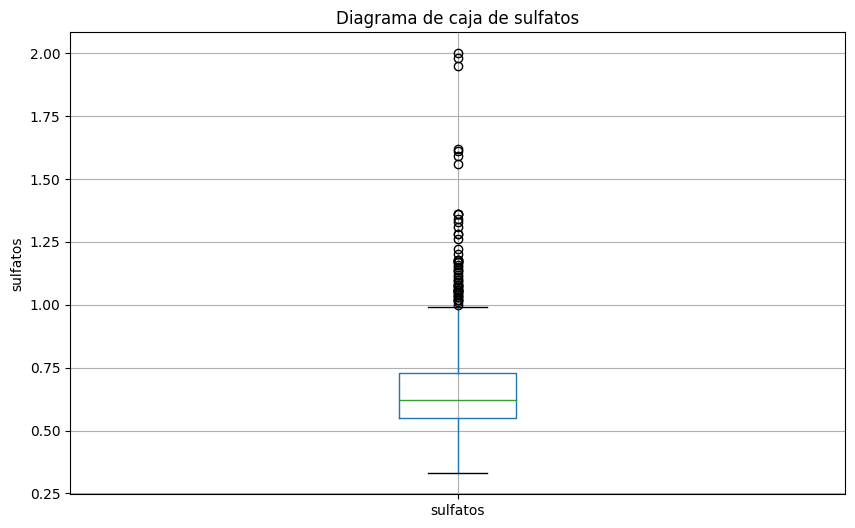

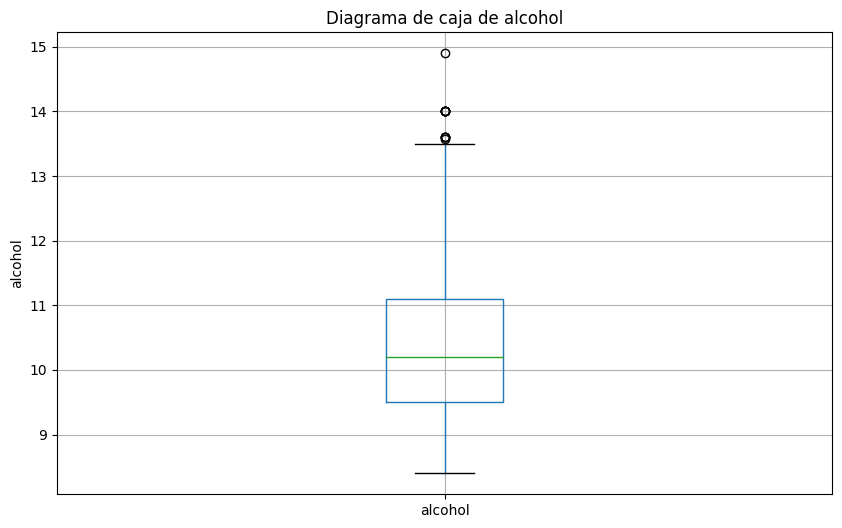

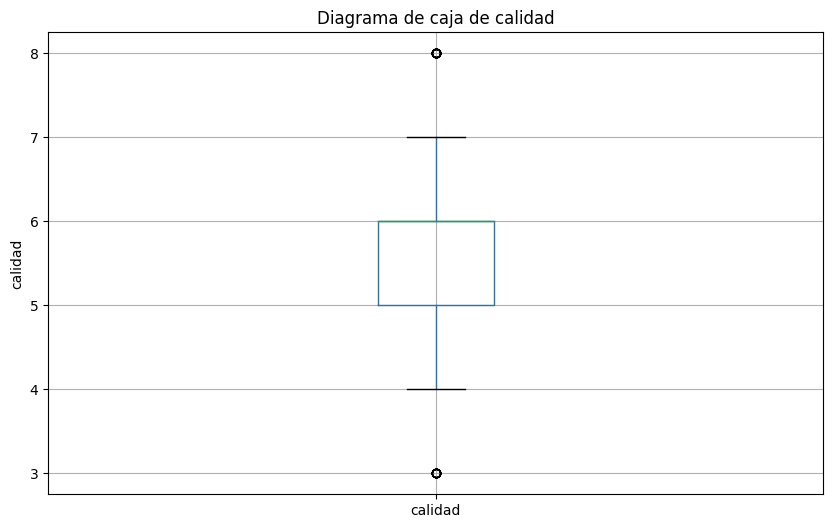

In [30]:
# @title Diagrama de caja para todo el dataset en un funcion

def boxplot(df, columns):
  for column in columns:
    df.boxplot(column, figsize=(10,6))
    plt.ylabel(column)
    plt.title(f'Diagrama de caja de {column}')
    plt.show()

boxplot(df_winequality_red_csv, df_winequality_red_csv.columns)

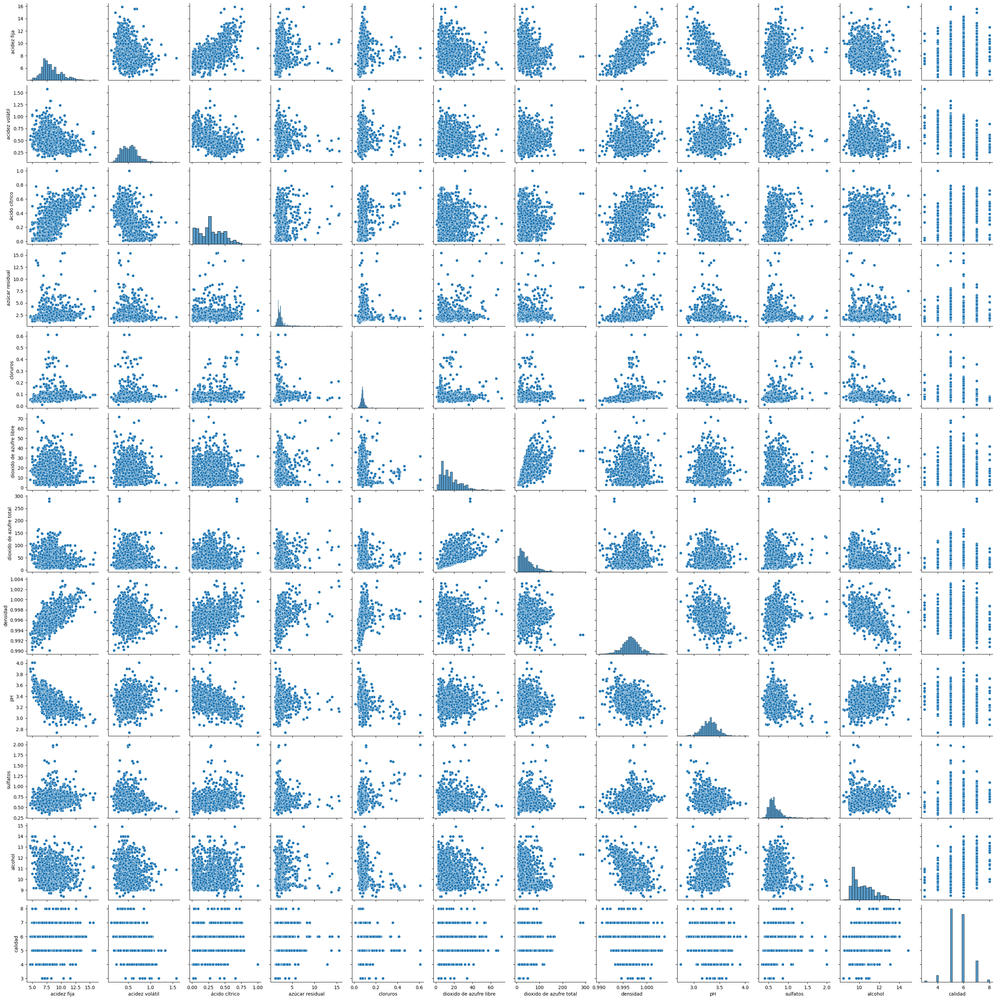

In [31]:
# @title Gráficos de dispersión de todo el dataset

# def scatter_matrix(df, columns):
#   pd.plotting.scatter_matrix(df[columns], figsize=(15,15))
#   # plt.xlabel(columns)
#   plt.ylabel('Frecuencia')
#   plt.title(f'Gráficos de dispersión de {columns}')
#   plt.show()

# scatter_matrix(df_winequality_red_csv, df_winequality_red_csv.columns)

sns.pairplot(df_winequality_red_csv)

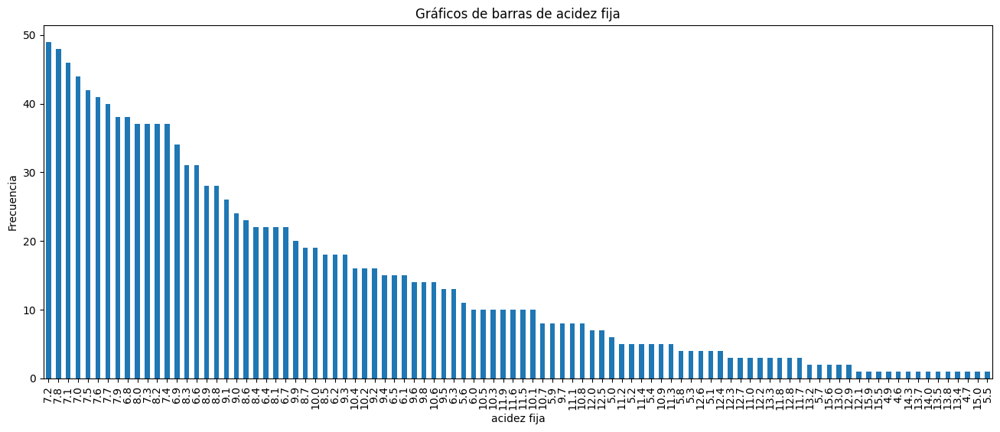

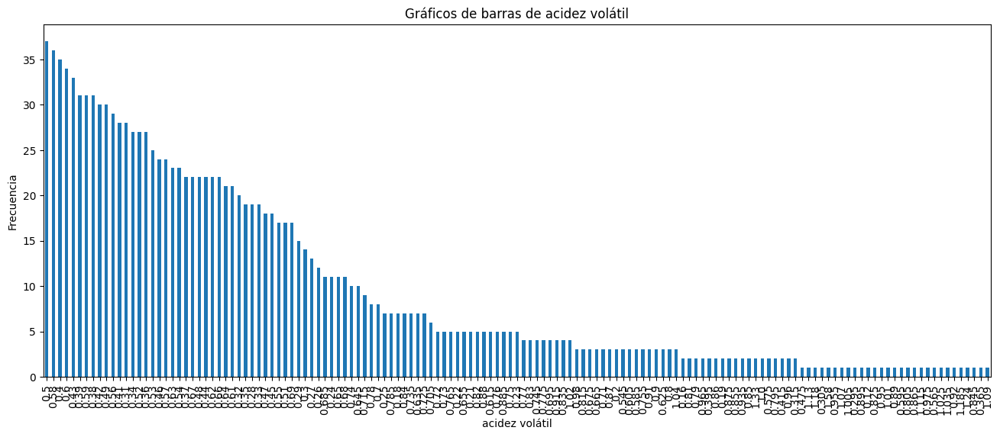

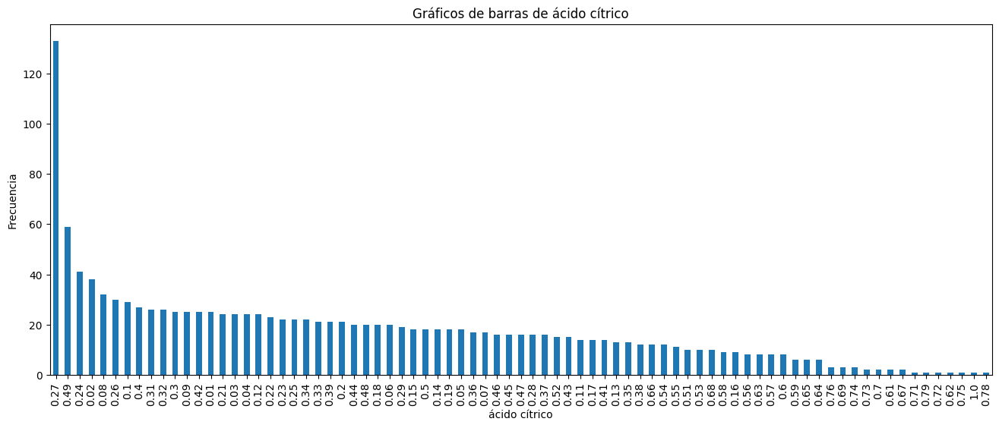

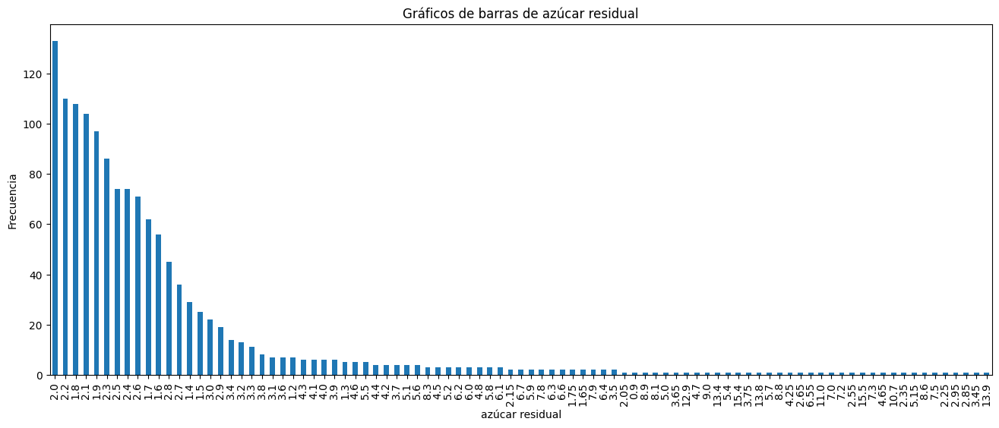

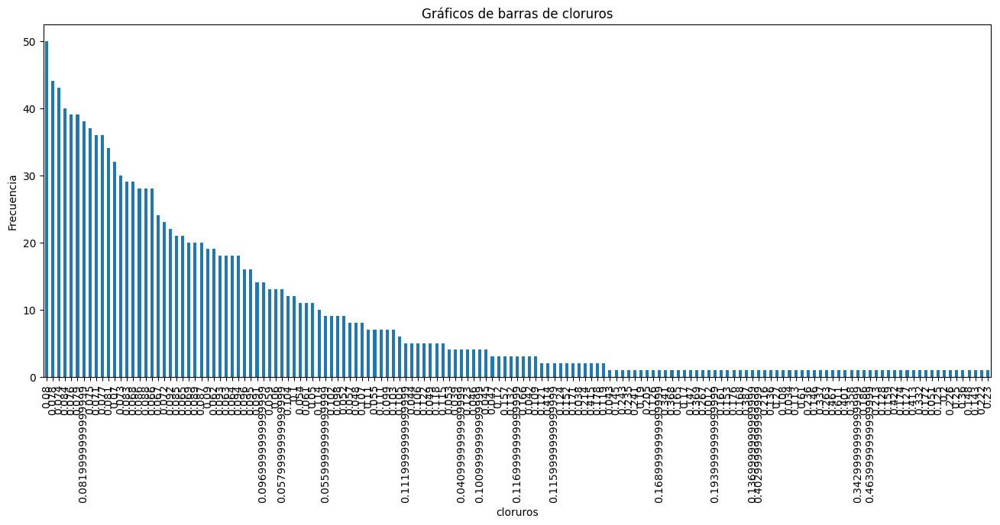

...

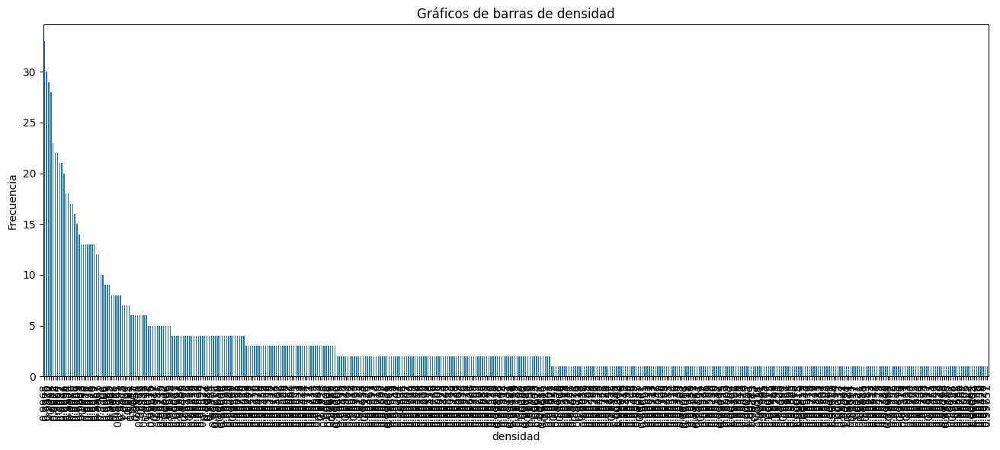

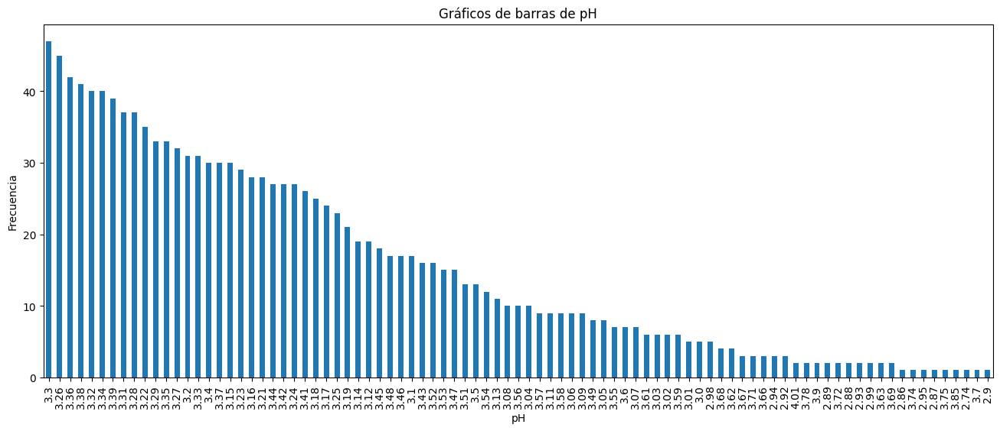

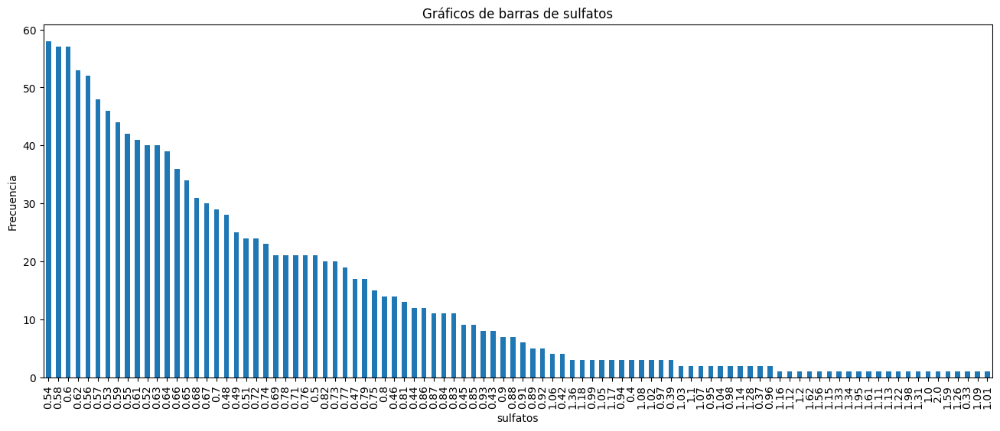

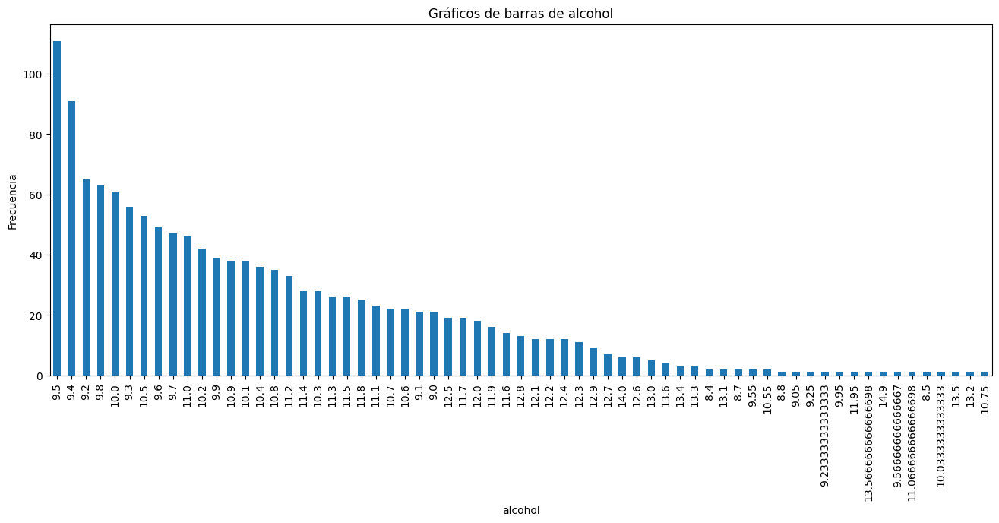

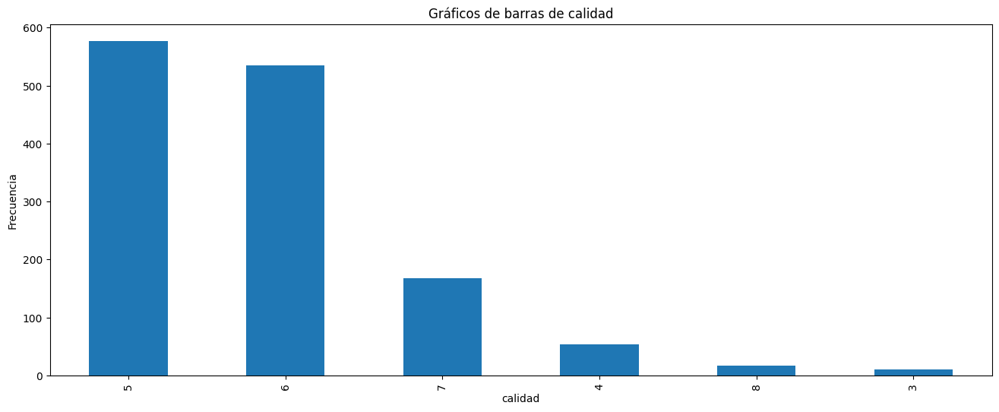

In [32]:
# @title Gráficos de barras con todo el dataset

def barplot(df, columns):
  for column in columns:
    df[column].value_counts().plot(kind='bar', figsize=(16,6))
    plt.ylabel('Frecuencia')
    plt.title(f'Gráficos de barras de {column}')
    plt.show()

barplot(df_winequality_red_csv, df_winequality_red_csv.columns)

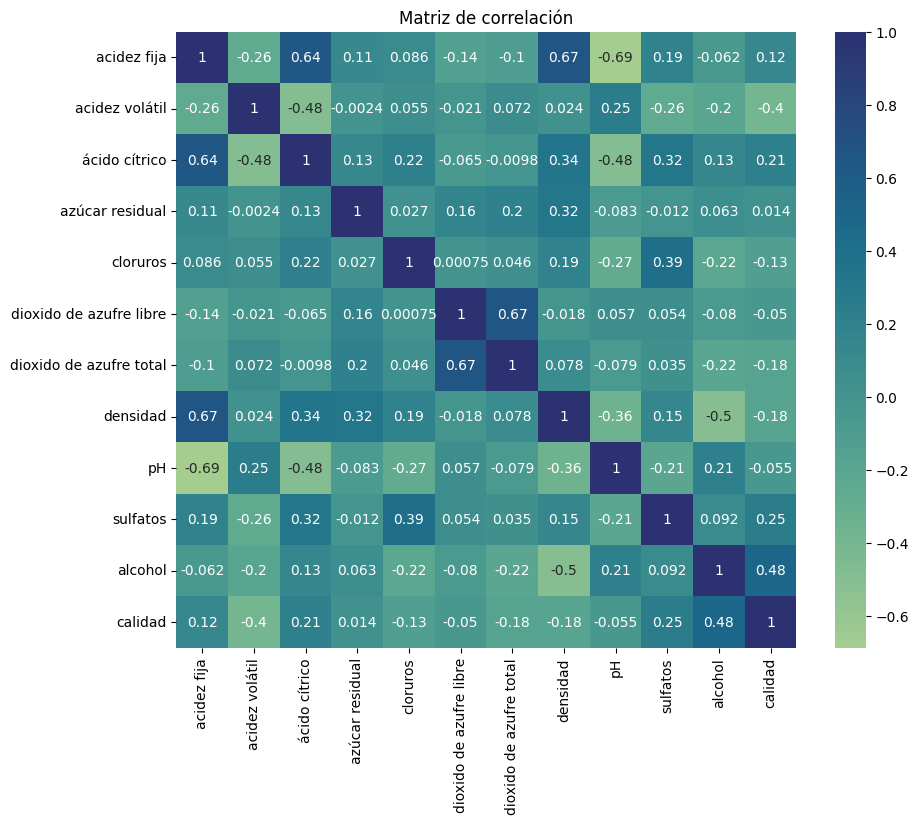

In [33]:
# @title Matrices de correlación crear funcion de todo el dataset


def correlation_matrix(df, columns):
  corr_matrix = df[columns].corr()
  fig, ax = plt.subplots(figsize=(10, 8))
  # sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
  # cmap=sns.diverging_palette(20, 50, as_cmap=True)
  cmap="crest"
  # cmap='coolwarm'
  sns.heatmap(corr_matrix, annot=True, cmap=cmap, ax=ax)
  plt.title('Matriz de correlación')
  plt.show()

correlation_matrix(df_winequality_red_csv, df_winequality_red_csv.columns)

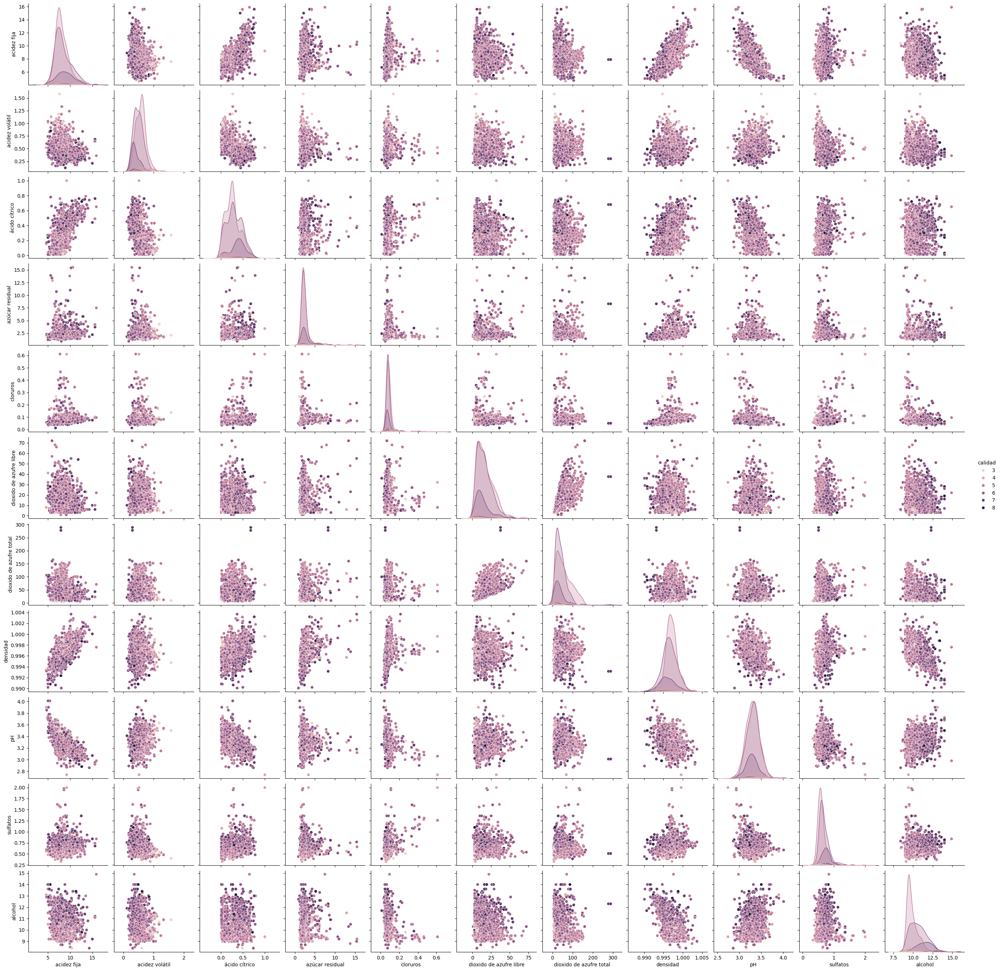

In [34]:
# @title Gráficos de dispersión con el target o variable objetivo -> calidad --> quality

sns.pairplot(df_winequality_red_csv, hue='calidad', kind='scatter')

# def pairplot(data, *, hue=None, hue_order=None, palette=None, vars=None, x_vars=None, y_vars=None, kind='scatter', diag_kind='auto', markers=None, height=2.5, aspect=1, corner=False, dropna=False, plot_kws=None, diag_kws=None, grid_kws=None, size=None)

<Axes: xlabel='pH', ylabel='calidad'>

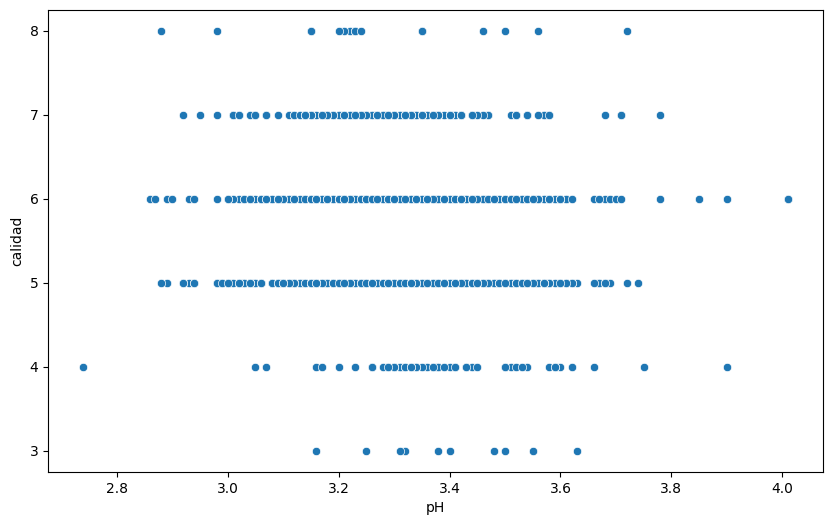

In [35]:
# @title Gráficos de dispersión variable x=ph y y=calidad

plt.figure(figsize=(10, 6))
sns.scatterplot(x='pH', y='calidad', data=df_winequality_red_csv)

<Axes: xlabel='alcohol', ylabel='calidad'>

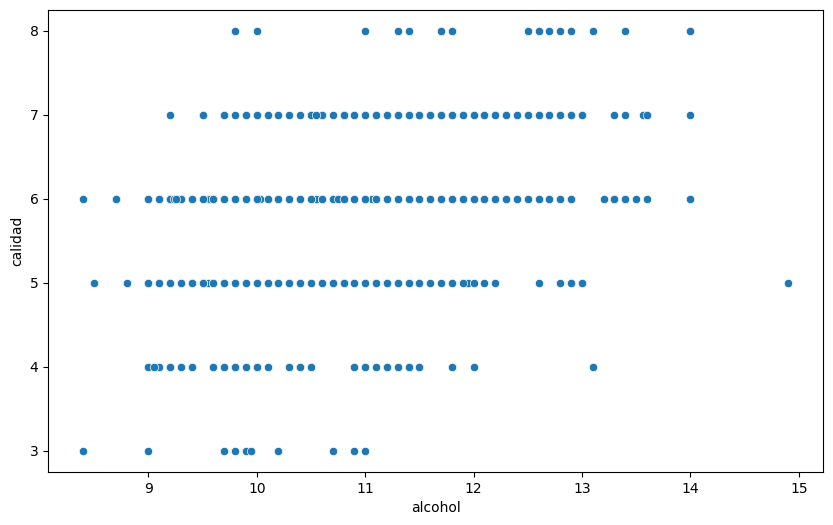

In [36]:
# @title Gráficos de dispersión variable y=calidad y x=alcohol

plt.figure(figsize=(10, 6))
sns.scatterplot(x='alcohol', y='calidad', data=df_winequality_red_csv)

Text(0.5, 1.0, 'Diagrama de caja de acidez volátil vs calidad')

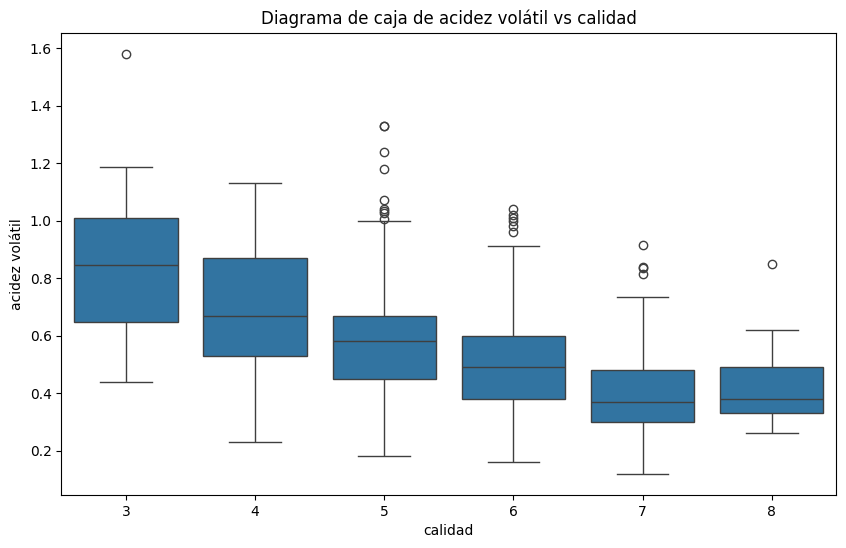

In [37]:
# @title Quality -> Calidad y Volatile acidity -> Acidez volátil

plt.figure(figsize=(10, 6))
sns.boxplot(x='calidad', y='acidez volátil', data=df_winequality_red_csv)
plt.title("Diagrama de caja de acidez volátil vs calidad")

Text(0.5, 1.0, 'Histograma de calidad')

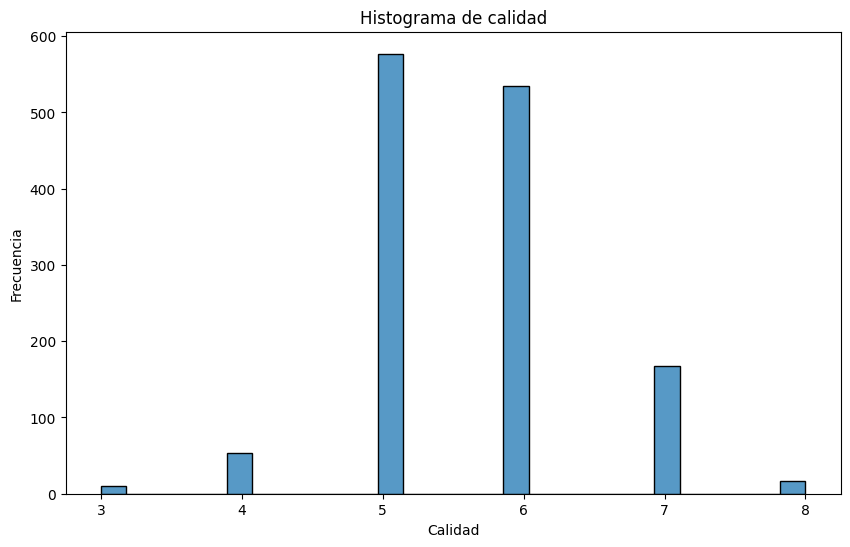

In [38]:
# @title Histograma de calidad

# df_winequality_red_csv['calidad'].hist(bins=10)

plt.figure(figsize=(10, 6))
sns.histplot(x='calidad',data=df_winequality_red_csv)
plt.xlabel('Calidad')
plt.ylabel('Frecuencia')
plt.title("Histograma de calidad")

In [39]:
# @title Grafico de histogram alcohol vs calidad

fig = px.histogram(df_winequality_red_csv, x="alcohol", color="calidad", barmode="group")
fig.update_layout(
    title="Distribución de Calidad vs Alcohol",
    xaxis_title="Alcohol",
    yaxis_title="Frecuencia",
    legend_title="Calidad"
)
fig.show()

In [25]:
# @title Valores medio de ácido cítrico con respecto 'acidez volátil' , 'acidez fija'

df_winequality_red_csv.groupby('ácido cítrico').mean()[['acidez volátil','acidez fija']]

,acidez volátil,acidez fija
ácido cítrico,,
0.01,0.637800,6.996000
0.02,0.660132,6.981579
0.03,0.676458,7.033333
0.04,0.659583,7.095833
0.05,0.750000,7.316667
...,...,...
0.75,0.290000,13.300000
0.76,0.488333,11.766667
0.78,0.310000,5.600000


In [41]:
# @title Valores minimos de ácido cítrico con respecto 'acidez volátil','acidez fija'
df_winequality_red_csv.groupby('ácido cítrico').min()[['acidez volátil','acidez fija']]

,acidez volátil,acidez fija
ácido cítrico,,
0.01,0.38,5.0
0.02,0.43,5.1
0.03,0.49,5.5
0.04,0.48,5.0
0.05,0.57,5.6
...,...,...
0.75,0.29,13.3
0.76,0.37,7.7
0.78,0.31,5.6


In [42]:
# @title Valor maximo de la columna ácido cítrico con respecto 'acidez volátil','acidez fija'

df_winequality_red_csv.groupby('ácido cítrico').max()[['acidez volátil','acidez fija']]

,acidez volátil,acidez fija
ácido cítrico,,
0.01,0.980,8.3
0.02,1.020,8.7
0.03,0.950,8.0
0.04,1.020,9.1
0.05,1.040,9.0
...,...,...
0.75,0.290,13.3
0.76,0.685,15.6
0.78,0.310,5.6


In [43]:
# @title Valores o cuneta de la columna ácido cítrico con respecto 'acidez volátil','acidez fija'

df_winequality_red_csv.groupby('ácido cítrico')[['acidez volátil','acidez fija']].value_counts()

ácido cítrico  acidez volátil  acidez fija
0.01           0.590           7.1            2
               0.380           5.0            1
               0.500           6.6            1
               0.510           6.8            1
               0.530           7.8            1
                                             ..
0.76           0.410           7.7            1
               0.685           15.6           1
0.78           0.310           5.6            1
0.79           0.530           13.5           1
1.00           0.520           9.2            1
Name: count, Length: 1333, dtype: int64

<Axes: xlabel='calidad', ylabel='densidad'>

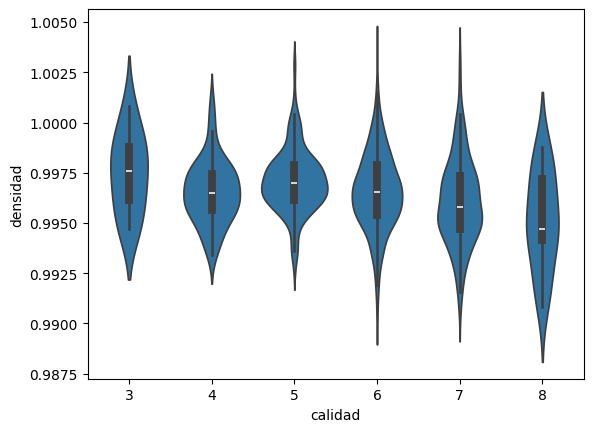

In [44]:
# @title Densidad vs Calidad

sns.violinplot(x='calidad', y='densidad', data=df_winequality_red_csv)
# sns.swarmplot(x='calidad', y='densidad', data=df_winequality_red_csv, color='black')

Text(0.5, 1.0, 'Diagrama de caja de calidad vs alcohol')

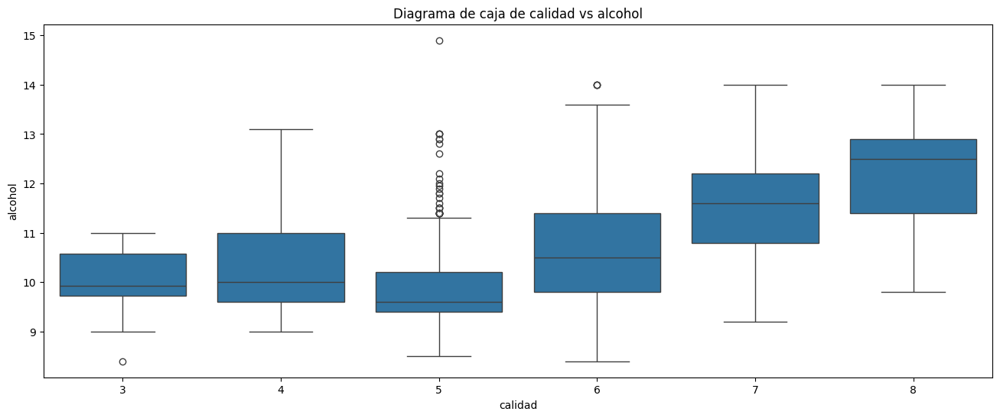

In [45]:
# @title Diagrama de caja de calidad vs alcohol

plt.figure(figsize=(16, 6))
sns.boxplot(x='calidad', y='alcohol', data=df_winequality_red_csv)
plt.title("Diagrama de caja de calidad vs alcohol")

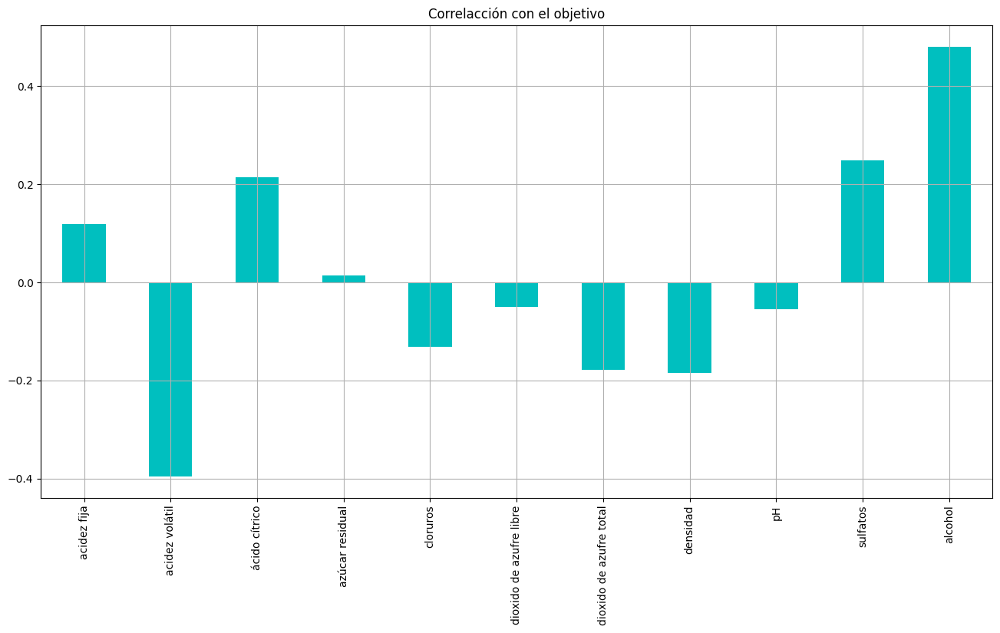

In [46]:
# @title Correlación con el objetivo

df_winequality_red_csv.drop('calidad', axis=1).corrwith(df_winequality_red_csv['calidad']).plot(kind='bar', figsize=(16,8), grid=True, title='Correlacción con el objetivo', color='c');

In [26]:
# @title Matrix de Correlación con el objetivo

df_winequality_red_csv.corr()

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad
acidez fija,1.000000,-0.255124,0.641076,0.111025,0.085886,-0.140580,-0.103777,0.670195,-0.686685,0.190269,-0.061596,0.119024
acidez volátil,-0.255124,1.000000,-0.484915,-0.002449,0.055154,-0.020945,0.071701,0.023943,0.247111,-0.256948,-0.197812,-0.395214
ácido cítrico,0.641076,-0.484915,1.000000,0.129689,0.219765,-0.065318,-0.009796,0.339434,-0.483025,0.315589,0.131860,0.213311
azúcar residual,0.111025,-0.002449,0.129689,1.000000,0.026656,0.160527,0.201038,0.324522,-0.083143,-0.011837,0.063281,0.013640
cloruros,0.085886,0.055154,0.219765,0.026656,1.000000,0.000749,0.045773,0.193592,-0.270893,0.394557,-0.223824,-0.130988
dioxido de azufre libre,-0.140580,-0.020945,-0.065318,0.160527,0.000749,1.000000,0.667246,-0.018071,0.056631,0.054126,-0.080125,-0.050463
dioxido de azufre total,-0.103777,0.071701,-0.009796,0.201038,0.045773,0.667246,1.000000,0.078141,-0.079257,0.035291,-0.217829,-0.177855
densidad,0.670195,0.023943,0.339434,0.324522,0.193592,-0.018071,0.078141,1.000000,-0.355617,0.146036,-0.504995,-0.184252
pH,-0.686685,0.247111,-0.483025,-0.083143,-0.270893,0.056631,-0.079257,-0.355617,1.000000,-0.214134,0.213418,-0.055245
sulfatos,0.190269,-0.256948,0.315589,-0.011837,0.394557,0.054126,0.035291,0.146036,-0.214134,1.000000,0.091621,0.248835


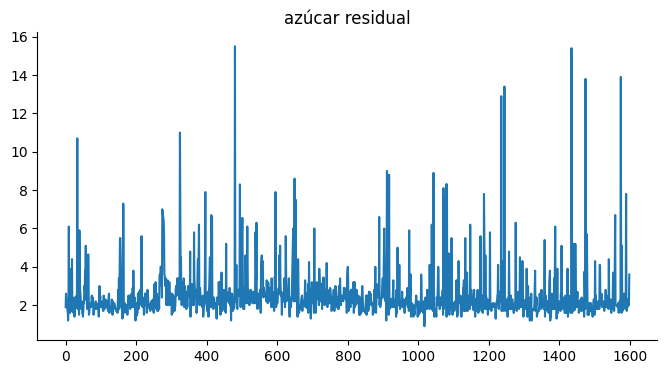

In [48]:
# @title Variables con correlación

df_winequality_red_csv['azúcar residual'].plot(kind='line', figsize=(8, 4), title='azúcar residual')
plt.gca().spines[['top', 'right']].set_visible(False)

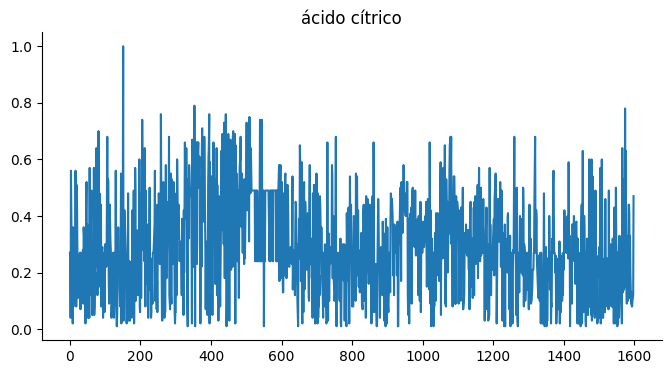

In [49]:
# @title Variables con correlación
df_winequality_red_csv['ácido cítrico'].plot(kind='line', figsize=(8, 4), title='ácido cítrico')
plt.gca().spines[['top', 'right']].set_visible(False)

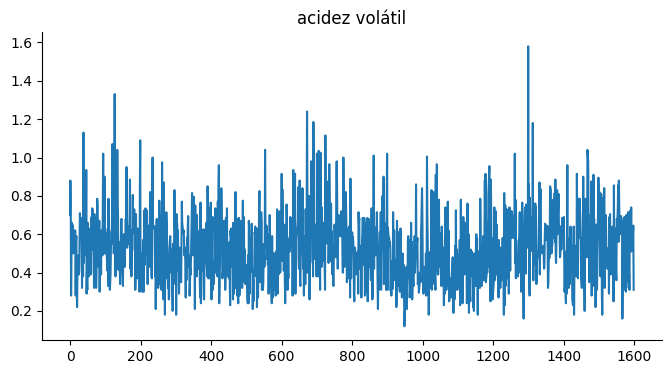

In [50]:
# @title Variables con correlación
df_winequality_red_csv['acidez volátil'].plot(kind='line', figsize=(8, 4), title='acidez volátil')
plt.gca().spines[['top', 'right']].set_visible(False)

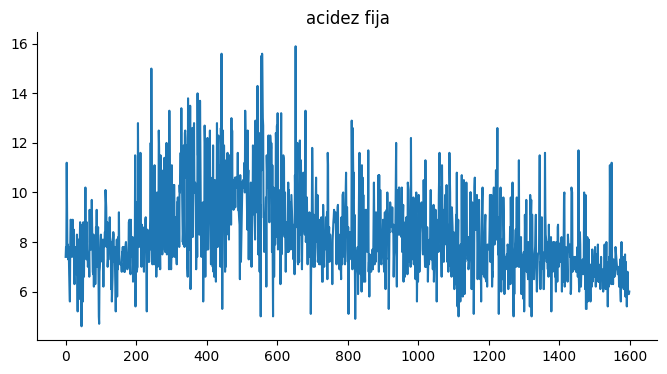

In [51]:
# @title Variables con correlación
df_winequality_red_csv['acidez fija'].plot(kind='line', figsize=(8, 4), title='acidez fija')
plt.gca().spines[['top', 'right']].set_visible(False)

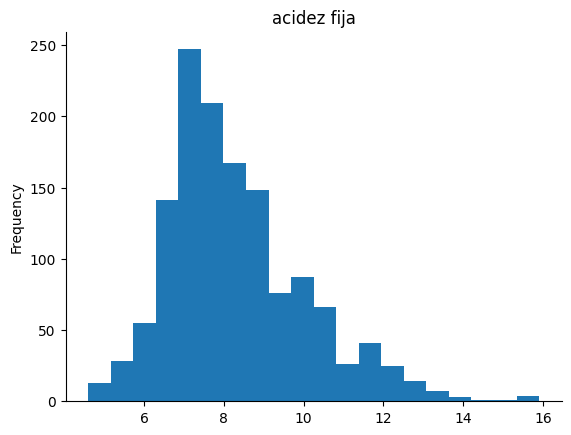

In [52]:
# @title Variables con correlación
df_winequality_red_csv['acidez fija'].plot(kind='hist', bins=20, title='acidez fija')
plt.gca().spines[['top', 'right',]].set_visible(False)

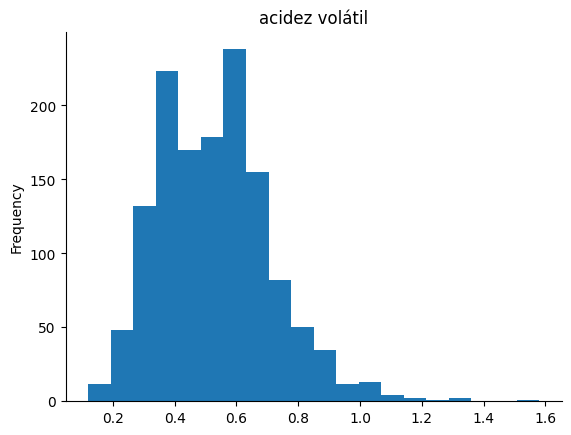

In [53]:
# @title Variables con correlación
df_winequality_red_csv['acidez volátil'].plot(kind='hist', bins=20, title='acidez volátil')
plt.gca().spines[['top', 'right',]].set_visible(False)

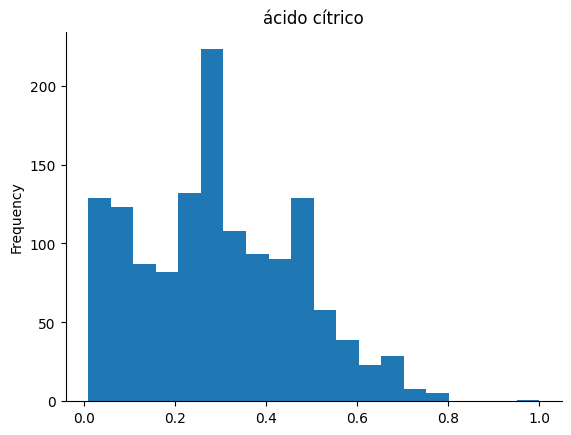

In [54]:
# @title Variables con correlación
df_winequality_red_csv['ácido cítrico'].plot(kind='hist', bins=20, title='ácido cítrico')
plt.gca().spines[['top', 'right',]].set_visible(False)

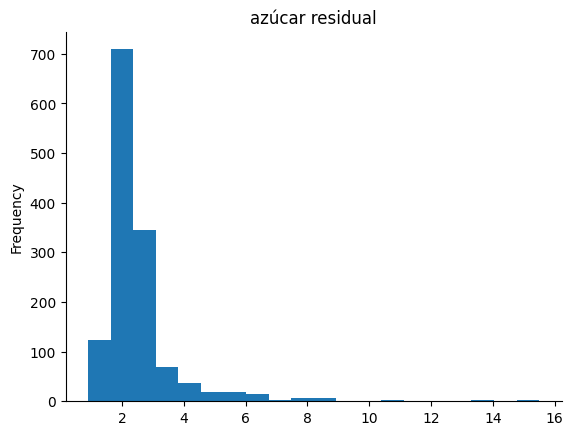

In [55]:
# @title Variables con correlación
df_winequality_red_csv['azúcar residual'].plot(kind='hist', bins=20, title='azúcar residual')
plt.gca().spines[['top', 'right',]].set_visible(False)

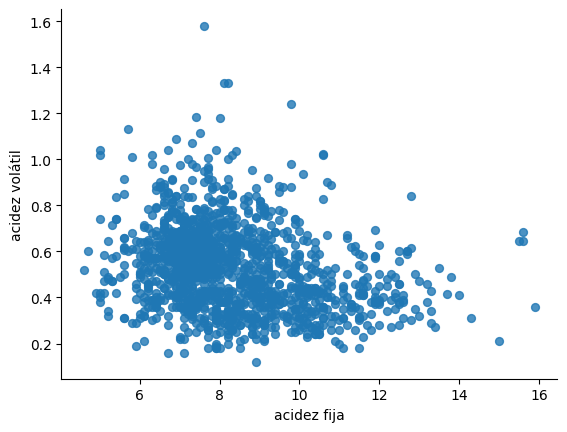

In [56]:
# @title Variables con correlación
df_winequality_red_csv.plot(kind='scatter', x='acidez fija', y='acidez volátil', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

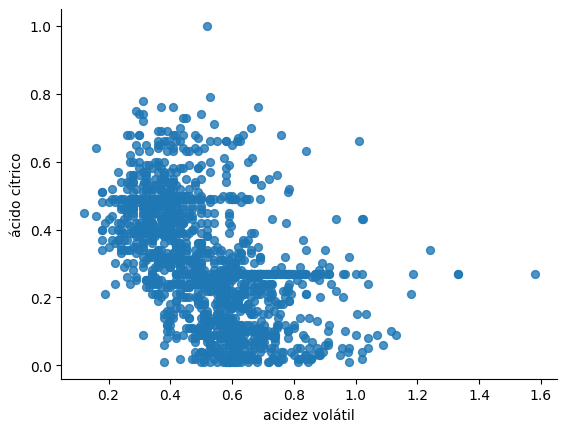

In [57]:
# @title Variables con correlación
df_winequality_red_csv.plot(kind='scatter', x='acidez volátil', y='ácido cítrico', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

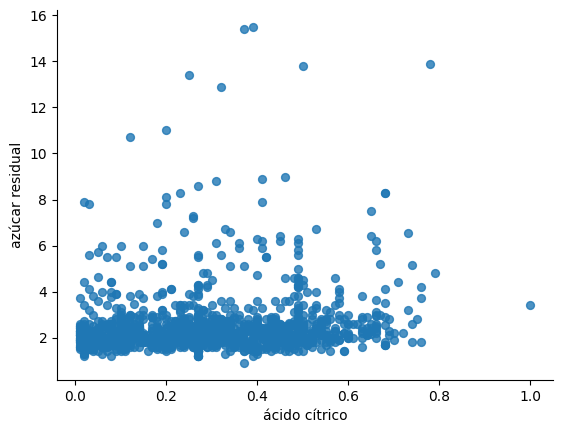

In [58]:
# @title Variables con correlación
df_winequality_red_csv.plot(kind='scatter', x='ácido cítrico', y='azúcar residual', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

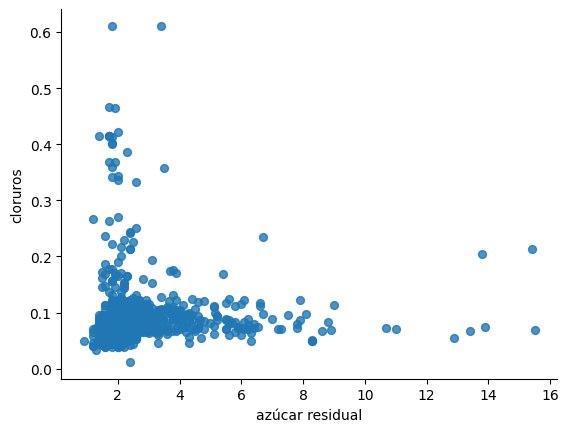

In [59]:

df_winequality_red_csv.plot(kind='scatter', x='azúcar residual', y='cloruros', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [27]:
# @title Cantidad segun cada uno de sus valores en calidad

df_winequality_red_csv["calidad"].value_counts()

,count
calidad,
5,577
6,535
7,167
4,53
8,17
3,10


In [61]:
# @title Mostramos en un grafico de barra.

# df_winequality_red_csv["calidad"].value_counts().plot(kind="bar",color=["salmon","lightblue"])

df_counts = df_winequality_red_csv["calidad"].value_counts().reset_index()
df_counts.columns = ['Calidad', 'count']  # Rename columns for clarity


fig = px.bar(
    df_counts,
    x='Calidad',
    y='count',
    color='Calidad',
    title='Calidad'
)
fig.update_layout(
    xaxis_title='Calidad',
    yaxis_title='Count',
    showlegend=False
)
fig.show()

# Modelado:

## Seleccionar el algoritmo:

- Regresión lineal, logística, árboles de decisión, random forest, SVM, redes neuronales, clustering (K-means, jerárquico, DBSCAN), etc.

## Entrenar el modelo:

- Ajustar los parámetros del modelo a los datos de entrenamiento.

## Evaluar el modelo:

- Utilizar métricas adecuadas (MSE, RMSE, precisión, recall, F1-score, matriz de confusión, curva ROC) y técnicas como validación cruzada.

In [28]:
# @title Revisamos las correlaciones individuales con la variable objetivo

df_winequality_red_csv.corr()['calidad'].sort_values(ascending=False)

,calidad
calidad,1.000000
alcohol,0.480343
sulfatos,0.248835
ácido cítrico,0.213311
acidez fija,0.119024
azúcar residual,0.013640
dioxido de azufre libre,-0.050463
pH,-0.055245
cloruros,-0.130988
dioxido de azufre total,-0.177855


In [65]:
# @title Division de los datos para entrenar el modelo.

X_data = df_winequality_red_csv.drop("calidad", axis=1) #

y_data = df_winequality_red_csv["calidad"] # Variable Objetivo -> Target

In [66]:
X_data.head(10)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol
0,7.4,0.70,0.27,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.27,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.27,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4
7,7.3,0.65,0.27,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5
10,6.7,0.58,0.08,1.8,0.097,15.0,65.0,0.9959,3.28,0.54,9.2


In [67]:
y_data.head(10)

,calidad
0,5
1,5
2,5
3,6
5,5
6,5
7,7
8,7
9,5
10,5


In [68]:
# @title División del dataset: Divide los datos en un conjunto de entrenamiento y otro de prueba, usando un 80% para entrenar el modelo y un 20% para probarlo.

# Dividimos el dataset en características (X) y la variable objetivo (y). Luego, dividimos en conjuntos de entrenamiento y prueba para evaluar correctamente el modelo.

X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=42)

In [69]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1087, 11), (272, 11), (1087,), (272,))

In [70]:
# @title Seleccionamos los algorimos para el Train

models = {
    'LogisticRegression': LogisticRegression(solver="liblinear"),
    # 'LinearRegression': LinearRegression(),
    # 'Lasso': Lasso(),
    # 'LassoCV': LassoCV(),
    'DecisionTree': DecisionTreeClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'GaussianNB': GaussianNB(),
    # 'MLPClassifier': MLPClassifier()
    # 'Gradient Boosting': GradientBoostingClassifier(),
    # 'XGBoost': XGBClassifier(),
    'AdaBoost': AdaBoostClassifier(),
}

def train_models(models, X_train, y_train, y_test):
    for name, model in models.items():
      print(f"Entrenamiento {name}...")
      model.fit(X_train, y_train)
      y_pred = model.predict(X_test)
      accuracy = accuracy_score(y_test, y_pred)
      print(f"{name} Exactitud: {accuracy:.2f}")
      print(classification_report(y_test, y_pred))
      print("\n")

train_models(models, X_train, y_train, y_test)

Entrenamiento LogisticRegression...
LogisticRegression Exactitud: 0.59
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        11
           5       0.68      0.77      0.72       120
           6       0.51      0.67      0.58       103
           7       0.00      0.00      0.00        31
           8       0.00      0.00      0.00         3

    accuracy                           0.59       272
   macro avg       0.20      0.24      0.22       272
weighted avg       0.50      0.59      0.54       272



Entrenamiento DecisionTree...
DecisionTree Exactitud: 0.47
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.10      0.09      0.10        11
           5       0.59      0.58      0.59       120
           6       0.43      0.44      0.43       103
           7       0.31      0.35      0.33        31


In [71]:
# @title Evaluacion de los modelos entrenados -> Ocurrencia en los modelos.

def evaluate_model(models, X_train, y_train, X_test, y_test):
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        print(f"{name} Exactitud: {accuracy:.2f}")
        # print(classification_report(y_test, y_pred))
        # print("\n")

evaluate_model(models, X_train, y_train, X_test, y_test)

LogisticRegression Exactitud: 0.59
DecisionTree Exactitud: 0.49
KNeighborsClassifier Exactitud: 0.47
Random Forest Exactitud: 0.65
SVM Exactitud: 0.48
GaussianNB Exactitud: 0.56
AdaBoost Exactitud: 0.54


Random Forest: 0.64
LogisticRegression: 0.59
GaussianNB: 0.56
AdaBoost: 0.54
DecisionTree: 0.51
SVM: 0.48
KNeighborsClassifier: 0.47


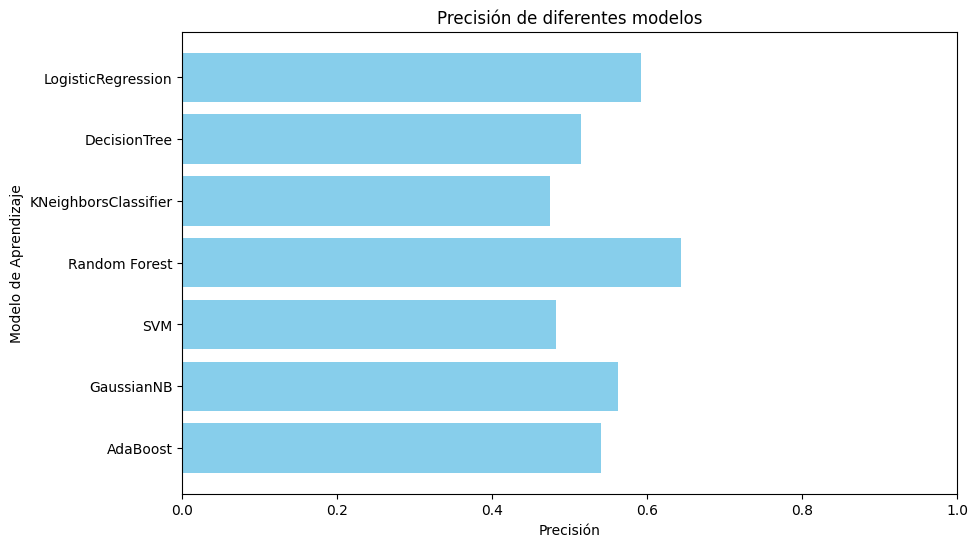

In [72]:
# @title Comparación de los Modelos

# Diccionario para almacenar precisiones
accuracies = {}

def compare_models(models, X_train, y_train, X_test, y_test):
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies[name] = accuracy
        # print(f"{name} Accuracy: {accuracy:.2f}")
        # print(classification_report(y_test, y_pred))
        # print("\n")

compare_models(models, X_train, y_train, X_test, y_test)

# Ordenar los modelos por precisión en orden descendente
sorted_models = dict(sorted(accuracies.items(), key=lambda x: x[1], reverse=True))

# Mostrar los modelos ordenados
for model_name, accuracy in sorted_models.items():
    print(f"{model_name}: {accuracy:.2f}")

# Create a bar plot for accuracies
plt.figure(figsize=(10, 6))
plt.barh(list(accuracies.keys()), list(accuracies.values()), color='skyblue')
plt.xlabel('Precisión')
plt.ylabel('Modelo de Aprendizaje')
plt.title('Precisión de diferentes modelos')
plt.xlim(0, 1)
plt.gca().invert_yaxis()
plt.show()

# Interpretación de Resultados:

## Explicar los resultados:

- Analizar los coeficientes del modelo, la importancia de las características, los clusters obtenidos, etc.


## Visualizar los resultados:

- Crear gráficos y visualizaciones que faciliten la comprensión de los resultados.

## Contestar las preguntas iniciales:

- Verificar si los resultados del modelo responden a las preguntas planteadas al inicio del análisis.

In [73]:
# @title Entrenamiento individual del modelo DecisionTree y prodicciones.
model_dt = models['DecisionTree']

model_train = model_dt.fit(X_train, y_train)

model_pred_dt = model_train.predict(X_test)

In [78]:
model_dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [77]:
model_dt.feature_importances_

array([0.07659998, 0.07990254, 0.06323436, 0.06321184, 0.06941229,
       0.06118732, 0.10506788, 0.08474961, 0.08312424, 0.14061537,
       0.17289457])

In [76]:
model_dt.classes_

array([3, 4, 5, 6, 7, 8])

In [75]:
model_dt.n_classes_

6

In [74]:
model_dt.n_features_in_

11

In [82]:
model_dt.n_outputs_

1

In [81]:
model_dt.score(X_test, y_test)

0.4963235294117647

In [80]:
model_dt.score(X_train, y_train)

1.0

In [79]:
model_pred_dt

array([5, 6, 7, 5, 4, 7, 6, 5, 6, 6, 6, 6, 5, 5, 7, 5, 6, 5, 5, 6, 5, 7,
       5, 6, 5, 5, 6, 6, 5, 6, 5, 7, 6, 6, 6, 6, 5, 6, 5, 8, 4, 6, 5, 5,
       5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 7, 5, 6, 5, 5, 5, 5, 6, 5, 5, 5, 6,
       5, 5, 5, 7, 6, 7, 6, 7, 6, 5, 5, 7, 5, 5, 6, 6, 6, 5, 5, 7, 5, 5,
       6, 6, 4, 5, 5, 6, 6, 6, 5, 7, 7, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 7,
       6, 7, 5, 5, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 5, 5,
       6, 5, 5, 6, 6, 6, 6, 6, 5, 5, 6, 7, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5,
       6, 6, 4, 5, 6, 6, 4, 5, 5, 7, 6, 7, 5, 5, 6, 6, 7, 6, 5, 6, 5, 5,
       5, 5, 6, 7, 6, 6, 5, 5, 5, 7, 6, 5, 5, 6, 5, 5, 7, 6, 5, 4, 6, 6,
       6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 4, 6, 6, 6, 6, 5, 7, 6, 6, 7, 5, 6,
       6, 7, 6, 6, 5, 5, 6, 6, 6, 6, 6, 6, 7, 6, 6, 8, 6, 5, 5, 4, 5, 6,
       4, 6, 7, 5, 5, 6, 6, 7, 6, 5, 7, 6, 5, 6, 5, 5, 6, 6, 7, 6, 5, 5,
       6, 6, 6, 4, 5, 6, 6, 5])

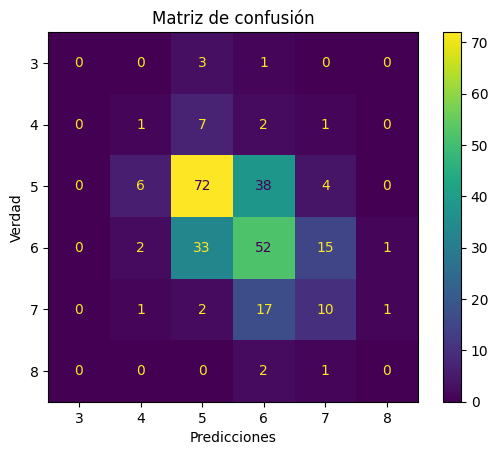

In [83]:
# @title Calcular la matriz de confusión con el modelo de Arbol de decisión

# cm = confusion_matrix(y_test, model_pred_dt)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_dt.classes_)

# # Graficar la matriz de confusión
# disp.plot(cmap=plt.cm.Blues)
# plt.show()

ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred = model_pred_dt),
                       display_labels=model_dt.classes_).plot()
plt.title("Matriz de confusión")
plt.xlabel("Predicciones")
plt.ylabel("Verdad")
plt.show()

In [84]:
# @title Desempeño del modelo de Arbol de decisión

print(classification_report(y_test, y_pred = model_pred_dt))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         4
           4       0.10      0.09      0.10        11
           5       0.62      0.60      0.61       120
           6       0.46      0.50      0.48       103
           7       0.32      0.32      0.32        31
           8       0.00      0.00      0.00         3

    accuracy                           0.50       272
   macro avg       0.25      0.25      0.25       272
weighted avg       0.49      0.50      0.49       272



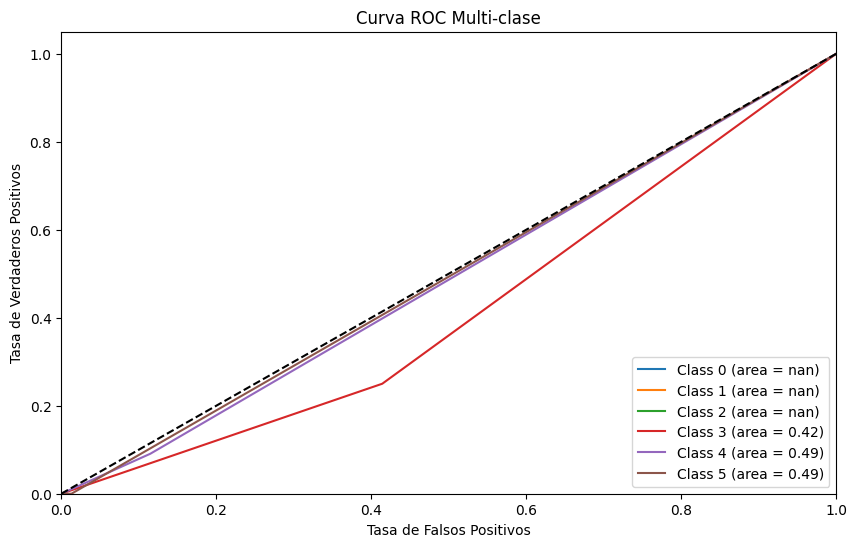

In [85]:
# @title Curva ROC

# Suponiendo que 'model_train' es un clasificador multiclase y 'y_test' tiene 6 clases (0-5)

# Binarizar la salida para cada clase
n_classes = 6 # number of classes in y_test

# Calcular fpr, tpr y umbrales para cada clase
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, model_train.predict_proba(X_test)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Trazar la curva ROC para cada clase
plt.figure(figsize=(10, 6))

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='Class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal que representa el azar.
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC Multi-clase")
plt.legend(loc="lower right")
plt.show()

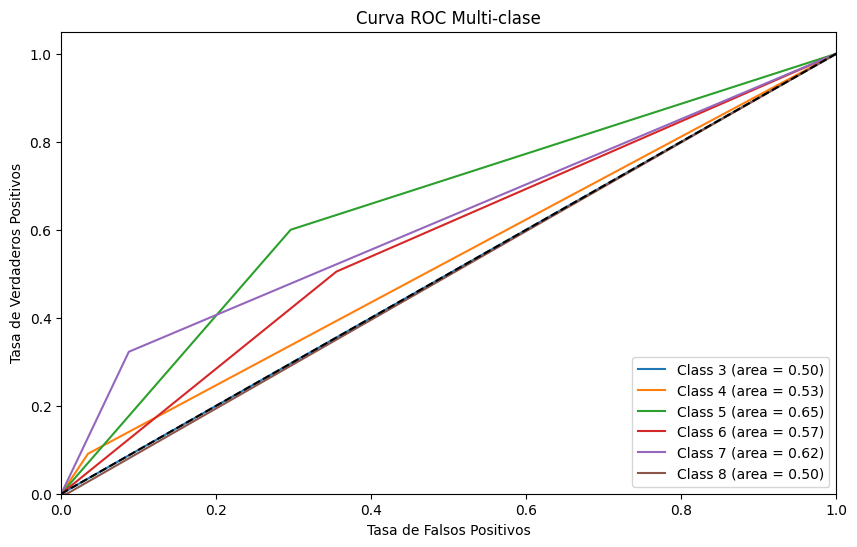

In [86]:
# @title Curva ROC

# Suponiendo que 'model_train' es un clasificador multiclase y 'y_test' tiene 6 clases (0-5)
n_classes = len(model_dt.classes_) # Get the number of classes from the model


# Binarizar la salida para cada clase
# Calcular fpr, tpr y umbrales para cada clase
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == model_dt.classes_[i], model_train.predict_proba(X_test)[:, i])
    # Utilice model_dt.classes_[i] para hacer coincidir la etiqueta de clase correctamente
    roc_auc[i] = auc(fpr[i], tpr[i])

# Trazar la curva ROC para cada clase
plt.figure(figsize=(10, 6))

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='Class {0} (area = {1:0.2f})'.format(model_dt.classes_[i], roc_auc[i]))
    # Mostrar etiqueta de clase de model_dt.classes_

plt.plot([0, 1], [0, 1], 'k--')  # Línea diagonal que representa el azar.
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC Multi-clase")
plt.legend(loc="lower right")
plt.show()

In [89]:
# @title Evaluacion del modelo Arbol de decisión con algunas metricas

# r2 = r2_score(y_test, model_pred_dt)
mse = mean_squared_error(y_test, model_pred_dt)
mae = mean_absolute_error(y_test, model_pred_dt)
rmse = np.sqrt(mean_squared_error(y_test, model_pred_dt))
vcross = cross_val_score(model_train, X_data, y_data, cv=KFold(5))

# print(f"Coeficiente de determinación R²: {r2}")
print(f"Error Cuadrático Medio (MSE): {mse:.2f}")
print(f"Error Absoluto Medio (MAE): {mae:.2f}")

print(f'El error cuadrático medio (RMSE) para el modelo en el primer paso es:: {rmse:.2f}')
print(f'La validación cruzada del modelo en el primer paso es: {vcross}')
print(f'La media de la validación cruzada del modelo en el primer paso es: {vcross.mean():.2f}')

Error Cuadrático Medio (MSE): 0.77
Error Absoluto Medio (MAE): 0.58
El error cuadrático medio (RMSE) para el modelo en el primer paso es:: 0.88
La validación cruzada del modelo en el primer paso es: [0.48529412 0.43382353 0.48897059 0.41176471 0.48339483]
La media de la validación cruzada del modelo en el primer paso es: 0.46


In [90]:
# @title Evaluacion del modelo Arbol de decisión con algunas metricas

accuracy = accuracy_score(y_test, model_pred_dt)
precision = precision_score(y_test, model_pred_dt, average='weighted')
recall = recall_score(y_test, model_pred_dt, average='weighted')
f1 = f1_score(y_test, model_pred_dt, average='weighted')

# Obtener probabilidades predichas en lugar de etiquetas de clase
y_probs = model_train.predict_proba(X_test)

# Calcular ROC AUC usando probabilidades
roc_auc = roc_auc_score(y_test, y_probs, multi_class='ovr', average='weighted')


print(f'Exactitud: {accuracy:.2f}')
print(f'Precisión: {precision}')
print(f'Sensibilidad : {recall}')
print(f'F1 Score: {f1:.2f}')
print(f'ROC y AUC Score: {roc_auc}')

Exactitud: 0.50
Precisión: 0.4881161118293471
Sensibilidad : 0.4963235294117647
F1 Score: 0.49
ROC y AUC Score: 0.6099315751515235


# Comunicación de Resultados:

## Crear reportes:

- Presentar los resultados de forma clara y concisa utilizando tablas, gráficos y texto.

## Hacer recomendaciones:

- Basadas en los resultados del análisis, hacer recomendaciones para la toma de decisiones.

# Interpretación del Histograma de Calidad
El histograma muestra la distribución de frecuencias de las calificaciones de calidad del vino.

Calidad 5: Es la calificación más frecuente, con alrededor de 600 ocurrencias. Esto indica que la mayoría de los vinos en el conjunto de datos son de calidad media.

Calidad 6: También es bastante común, con alrededor de 400 ocurrencias, sugiriendo que una gran parte de los vinos tienen una calidad ligeramente por encima del promedio.

Calidades 3, 4, 7 y 8: Estas calificaciones son mucho menos frecuentes. Las calificaciones 3 y 8 son especialmente raras, casi inexistentes.

Este análisis inicial nos dice que la mayoría de los vinos están agrupados en la calificación media (5-6), con muy pocos extremos de baja o alta calidad.

# Interpretación del Diagrama de Caja de Alcohol
Mediana: La mediana del contenido de alcohol es aproximadamente 10, lo que indica que la mitad de los vinos tienen un contenido de alcohol menor a 10 y la otra mitad mayor a 10.

Rango Intercuartil (IQR): El IQR se extiende aproximadamente de 9.5 a 11.5, lo que sugiere que la mayoría de los vinos tienen un contenido de alcohol en este rango.

Bigotes: Los bigotes se extienden desde aproximadamente 9 hasta 13, mostrando el rango total de los datos, excluyendo los valores atípicos.

Valores Atípicos: Hay tres valores atípicos por encima del bigote superior, con valores alrededor de 14 y 15, indicando algunos vinos con contenido de alcohol significativamente más alto.

#Interpretación del Pair Plot
Un pair plot es excelente para visualizar relaciones entre múltiples variables. Cada celda en la cuadrícula representa un scatter plot de dos variables, mientras que las celdas diagonales muestran la distribución (histograma) de cada variable individual.

Observaciones Generales:
Correlaciones: Podemos identificar correlaciones positivas o negativas entre variables. Por ejemplo, si vemos una línea ascendente en una celda específica, indica una correlación positiva.

Distribuciones: Los histogramas en la diagonal nos permiten ver la distribución de cada variable, dándonos una idea de si los datos están sesgados o son simétricos.

Outliers: Este gráfico es útil para identificar posibles outliers que se destacan de los patrones generales.

#Interpretación del Gráfico de Barras de Sulfatos
El gráfico muestra la frecuencia de niveles de sulfatos en el conjunto de datos.

Nivel más frecuente: El nivel de sulfatos más frecuente está alrededor de 0.54, con una frecuencia aproximada de 60. Esto sugiere que la mayoría de los vinos tienen un contenido de sulfatos cercano a este valor.

Distribución: La distribución de los niveles de sulfatos está bastante dispersa, con niveles que van desde 0.54 hasta 1.01.

Frecuencia baja: Los niveles de sulfatos más altos (alrededor de 1.01) tienen una frecuencia mucho menor, cercana a 0, indicando que son bastante raros en el conjunto de datos.

#Interpretación de la Matriz de Correlación
La matriz de correlación muestra cómo las diferentes propiedades químicas del vino se relacionan entre sí y con la calidad del vino. Aquí tienes algunos puntos destacados:

Alcohol y Calidad: Existe una correlación positiva moderada entre el contenido de alcohol y la calidad del vino (alrededor de 0.5). Esto sugiere que, en general, un mayor contenido de alcohol está asociado con una mayor calidad del vino.

pH y Acidez Volátil: Hay una correlación negativa moderada entre el pH y la acidez volátil (-0.4). Esto indica que a medida que aumenta la acidez volátil, el pH tiende a disminuir.

Dióxido de Azufre Libre y Dióxido de Azufre Total: Existe una alta correlación positiva entre estas dos variables (alrededor de 0.7), lo cual es esperable ya que ambos miden componentes relacionados del dióxido de azufre en el vino.

#Interpretación del Violin Plot de Densidad
El violin plot nos da una visión detallada de la distribución de la densidad del vino a través de diferentes niveles de calidad.

Observaciones Clave:
Distribución de Densidad: Cada "violín" muestra cómo se distribuyen las densidades para cada nivel de calidad.

Mediana e IQR: Los box plots dentro de los violines indican la mediana y el rango intercuartil (IQR) de la densidad para cada nivel de calidad. La mediana es el punto central y el IQR muestra la dispersión central.

Variabilidad: Las formas de los violines reflejan la densidad de los datos: zonas más anchas indican mayor concentración de datos en esos valores.

#Interpretación del Diagrama de Caja: Calidad vs Alcohol
El diagrama de caja muestra cómo varía el contenido de alcohol con la calidad del vino. Aquí hay algunos puntos clave:

Calidad 5 y 6: La mayoría de los vinos con calificación 5 y 6 tienen un contenido de alcohol que oscila entre 9 y 13, con una mediana cerca de 10.

Calidad 7 y 8: Los vinos de mejor calidad (7 y 8) tienden a tener un contenido de alcohol más alto, con medianas que rondan los 11-12.

Valores Atípicos: Hay algunos valores atípicos, especialmente en las calificaciones 8, que muestran vinos con contenido de alcohol significativamente más alto de lo usual.

Tendencia General: Parece haber una tendencia a que vinos de mayor calidad tengan un mayor contenido de alcohol.

#Interpretación del Gráfico de Correlación con el Objetivo
El gráfico muestra los coeficientes de correlación de varias características con una variable objetivo. Aquí tienes algunos puntos clave:

Características más Positivamente Correlacionadas:
Alcohol: Tiene la correlación positiva más fuerte con la variable objetivo, lo que sugiere que a medida que aumenta el contenido de alcohol, también lo hace la variable objetivo.

Sulfatos: También muestra una correlación positiva significativa, aunque no tan fuerte como el alcohol.

Característica más Negativamente Correlacionada:
Acidez Volátil: Es la característica más negativamente correlacionada, indicando que a medida que aumenta la acidez volátil, la variable objetivo tiende a disminuir.


#Resultados del Entrenamiento de Modelos

##Logistic Regression
Exactitud: 0.59

Resultados: Buen desempeño en la clase 5 (f1-score: 0.72) y 6 (f1-score: 0.58), pero muy pobre en las demás clases, especialmente en 3 y 8 con f1-score de 0.00.

##Decision Tree
Exactitud: 0.50

Resultados: Rendimiento moderado en las clases 5 y 6, pero muy bajo en otras clases. La precisión y el recall son bastante bajos en la mayoría de las clases.

##K-Nearest Neighbors (KNN)
Exactitud: 0.47

Resultados: Buen rendimiento en clase 5 (f1-score: 0.56), pero rendimiento bajo en otras clases. La clase 4 tiene una precisión muy alta pero un recall muy bajo, lo cual puede ser debido al tamaño pequeño de la muestra.

##Random Forest
Exactitud: 0.66

Resultados: Buen rendimiento en clase 5 (f1-score: 0.73) y 6 (f1-score: 0.65), rendimiento moderado en clase 7. En general, tiene un mejor rendimiento que otros modelos.

##SVM
Exactitud: 0.48

Resultados: Buen rendimiento en clase 6 (f1-score: 0.56), pero muy bajo en clase 7 (f1-score: 0.06) y 3, 4, y 8 (f1-score: 0.00).

##Gaussian Naive Bayes
Exactitud: 0.56

Resultados: Buen rendimiento en clases 5 y 6. Clase 7 tiene un rendimiento moderado. Las clases 3 y 8 tienen un f1-score de 0.00.

##AdaBoost
Exactitud: 0.54

Resultados: Buen rendimiento en clase 5 (f1-score: 0.69), rendimiento moderado en clase 6. Rendimiento muy bajo en otras clases, especialmente clase 7 (f1-score: 0.06).

##Conclusión
Random Forest parece ser el mejor modelo en términos de exactitud y balance de rendimiento en diferentes clases.

Logistic Regression y GaussianNB tienen rendimientos aceptables en clases 5 y 6, pero fallan en otras.

AdaBoost y Decision Tree no parecen ser adecuados debido a su baja exactitud general y su incapacidad para manejar bien las clases menos representadas.

#Desempeño del Modelo: Árbol de Decisión
El modelo de árbol de decisión tiene los siguientes resultados:

Exactitud: 0.50

##Desempeño por Clase:
Calidad 3: Precisión y recall de 0.00, f1-score de 0.00. El modelo no ha identificado correctamente ninguna instancia de esta clase.

Calidad 4: Precisión y recall de 0.00, f1-score de 0.00. Similar a la clase 3, no hay identificaciones correctas.

Calidad 5: Precisión de 0.61, recall de 0.58, f1-score de 0.60. Mejor desempeño del modelo, pero aún lejos de ser ideal.

Calidad 6: Precisión de 0.46, recall de 0.51, f1-score de 0.49. Desempeño razonable, pero no excepcional.

Calidad 7: Precisión de 0.41, recall de 0.42, f1-score de 0.41. Resultados moderadamente bajos.

Calidad 8: Precisión y recall de 0.00, f1-score de 0.00. Ningún vino clasificado correctamente en esta categoría.

Promedios:
Macro promedio: Precisión 0.25, recall 0.25, f1-score 0.25. Esto indica que, en promedio, el modelo tiene un desempeño muy bajo para cada clase.

Promedio ponderado: Precisión 0.49, recall 0.50, f1-score 0.49. Los valores ponderados indican que el modelo tiene un desempeño mediocre en general.

##Conclusiones
Desempeño: El modelo de árbol de decisión no parece ser adecuado para este problema, dado su bajo desempeño en casi todas las clases, especialmente en las de calidad extrema (3 y 8).

#Evaluación del Modelo: Árbol de Decisión

Métricas de Error:
Error Cuadrático Medio (MSE): 0.79

Error Absoluto Medio (MAE): 0.59

Error Cuadrático Medio de la Raíz (RMSE): 0.89

Estas métricas de error indican que el modelo tiene una cierta cantidad de desviación entre las predicciones y los valores reales, con RMSE proporcionando una interpretación más tangible en la misma escala que los datos.

## Validación Cruzada:
Resultados de la validación cruzada: [0.48161765, 0.45220588, 0.51470588, 0.41176471, 0.47232472]

Media de la validación cruzada: 0.47

Estos resultados muestran la variabilidad del desempeño del modelo en diferentes subconjuntos del conjunto de datos, con una media de validación cruzada que refleja una exactitud moderada.

## Otras Métricas de Desempeño:
Exactitud: 0.50

Precisión: 0.489

Sensibilidad (Recall): 0.50

F1 Score: 0.49

ROC y AUC: 0.610

Estas métricas adicionales indican que el modelo tiene un desempeño mediocre en general. La métrica ROC y AUC de 0.610 sugiere una capacidad de discriminación moderada entre las clases.

## Conclusión
El modelo de Árbol de Decisión tiene un desempeño limitado en términos de precisión y exactitud, con variabilidad en la validación cruzada y un error de predicción notable. Aunque estas métricas proporcionan una visión completa del desempeño del modelo, es claro que hay margen para mejorar.

# Entrenamiento del modelo pero con la variable objetivo modificada a binario donde vamos a seleccionar de la variable calidad.

In [29]:
# @title Convertimos la columna calidad a calidad_bin es decir a binarios 0 y 1 donde 0 es malo y 1 es bueno

# bins = (2, 6.5, 8)
# group_names = ['Malo', 'Bueno'] # Malo -> 0 , Bueno -> 1
# df_winequality_red_csv['calidad'] = pd.cut(df_winequality_red_csv['calidad'], bins = bins, labels = group_names)

# df_winequality_red_csv['calidad_bin'] = df_winequality_red_csv['calidad'].apply(lambda x: 0 if x <= 6 else 1)

calidad_bin = {
    3: 0,
    4: 0,
    5: 0,
    6: 0,
    7: 1,
    8: 1,
}

# def calidad_bin(x):
#   if x <= 6:
#     return 0
#   else:
#     return 1

# calidad_bin = []
# for i in df_winequality_red_csv['calidad']:
#     if i >= 1 and i <= 6:
#         calidad_bin.append('0')
#     elif i >= 7 and i <= 10:
#         calidad_bin.append('0')
# df_winequality_red_csv['calidad_bin'] = calidad_bin

df_winequality_red_csv['calidad_bin'] = df_winequality_red_csv['calidad'].map(calidad_bin)

In [30]:
# df_winequality_red_csv['calidad_bin'].value_counts().plot(kind='bar', figsize=(14,8))
# plt.xlabel('Calidad Bin')
# plt.ylabel('Frecuencia')
# plt.title('Calidad Bin')
# plt.show()

df_counts = df_winequality_red_csv["calidad_bin"].value_counts().reset_index()
df_counts.columns = ['Calidad', 'count']  # Rename columns for clarity


fig = px.bar(
    df_counts,
    x='Calidad',
    y='count',
    color='Calidad',
    title='Calidad'
)
fig.update_layout(
    xaxis_title='Calidad',
    yaxis_title='Count',
    showlegend=False
)
fig.show()

In [31]:
df_winequality_red_csv.head(10)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad,calidad_bin
0,7.4,0.70,0.27,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.27,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,0
5,7.4,0.66,0.27,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,0
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5,0
7,7.3,0.65,0.27,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,1
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,1
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5,0
10,6.7,0.58,0.08,1.8,0.097,15.0,65.0,0.9959,3.28,0.54,9.2,5,0


In [32]:
# @title Eliminamos columna calidad

df_winequality_red_csv.drop('calidad', axis=1, inplace=True)

In [33]:
df_winequality_red_csv.head(5)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol,calidad_bin
0,7.4,0.70,0.27,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.27,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,0
5,7.4,0.66,0.27,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,0


In [108]:
!pip install summarytools

from summarytools import dfSummary

dfSummary(df_winequality_red_csv)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.0 MB/s eta 0:00:00


No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,acidez fija[float64],Mean (sd) : 8.3 (1.7)min < med < max:4.6 < 7.9 < 15.9IQR (CV) : 2.1 (4.8),96 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACoElEQVR4nO3dvY7aQBRA4TuwIPMjI0QEHU3KSCkoeYg8bB4hSDwBbSo6JAsZ4WBhBqfaNLsLy3gc5lrn62d3iiNrveOrMWVZChC61rM3AHzGy7M3cIsxpiciXcfl57IsTz73g+cJNlRjTG8ymfyI43jssv5wOOyNMT+JtRmCDVVEunEcj5fL5Wk0GuWPLEzTNFqv1+MkSboiQqgNEHKoIiIyGo3y6XT6x2Fpz/tm8DS8TEEFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQoXgv/B3Za3tiEhsjHH9EQwHBqSRoWZZ1imK4vt8Pm+32+2H5q1eMRwYlkaGej6fX6Io6i8Wi3w2m+0fXc9wYHgaGeqrwWDgOhgownBgUHiZggqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoUOvXUxVvNYmv12vH536gV22hVr3VpCiKyFr7Lc/zXyLi+qkeGqLOJ6rzrSYiItvtdrzZbPqXy6Vdx+agS+0fTrvearLf7/lwGf/wMgUVGj2KUkXFKVYmWD0j1HdUnWJlgtU/Qn1HlSlWJljrQag3VJhi5UXQM16moAKhQgVChQqEChUIFSoQKlQgVKjA/1FrwPGrf4TqGcev9SBUzzh+rQeh1sT1+NVaGwt3D7xBqAHh7oGPEWpAuHvgY4QaIO4eeOtuqBVGnhl3hjc3Q60y8sy4M3y690R1Hnlm3Bk+fepvVJeRZ8adn6Opp2K8TDVIk0/FCLVBqp6KrVaraZIkX4wxB8cttETk6rj25tP8U6GmaRo9+luPx2MkIpJlWbTb7fr/c73W3+1r3y5Op1Olp7G1tpNl2dfhcPi71WoVj66/9zT/C6OcgEv0tpITAAAAAElFTkSuQmCC"">",0(0.0%)
2,acidez volátil[float64],Mean (sd) : 0.5 (0.2)min < med < max:0.1 < 0.5 < 1.6IQR (CV) : 0.2 (2.9),143 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAC0klEQVR4nO3dT27aQBSA8fdKQIaoY1lEsOMCkbpgyaY3yGG7zS6RkgtwAzYICRkQFBdj3EX/bJomeGw3fvT77ceexSeLGVuM5nkuQNN9eO8JAOe4eu8J1EVVuyLSKXGJQ57n+6rmg3IuMlRV7fb7/TvnXOR7jc1mE6vqF2JthosMVUQ6zrloMpnswzBMig5er9fB09NTtFwuOyJCqA1wqaGKiEgYhslgMPjqObxb6WRQCospmECoMIFQYUKtv1HZIkJVagu1ii2i1Wq1VdV7ESm6cnen06nte180T51P1FJbRPP5/OPz8/Pn0Wh002q1Co1P0zTIsuw2SZIHEfFd9aNBat+e8t0iiuO4GwRBbzweJ8PhMC4ydjabRdPptHc8HltF74tmavw+6vX1deHQ4zhmD/TCsOqHCYQKEwgVJhAqTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDCBUGECocIEQoUJhAoTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYQKhwgRChQmN/8fp95JlWVtEnKr6DOc0l4oR6gt2u107TdNPo9GoVfSgCxEO/K0Dob7gcDhc+R50wYG/9SDUV/gcdPETh11UjMUUTCBUmECoMIFQYQKhwgRChQmEChMIFSa8ueGvql0R6Xhc251Op7bHOOAPr4aqqt1+v3/nnIuKXjhN0yDLstskSR5ExOftDvDbW0/UjnMumkwm+zAMC32cMZvNoul02jsej60S8zOJL6+qd9a7/jAMC7/zjuP4v3zfzZdX9eCjlIrx5VU9CLUmfHlVLbanYAJP1IYpuRATudDFGKE2SNmFmMjlLsYItUHKLMREfizGHh8fB8vl8kZVNz5TaGrgZ4W6Xq+DohfebreBiMhutwsWi0XvX463eu9fY33t9/tST+TVarVV1XsR8Xqal/Qtz/O/3vc76oA35zfpOg0AAAAASUVORK5CYII="">",0(0.0%)
3,ácido cítrico[float64],Mean (sd) : 0.3 (0.2)min < med < max:0.0 < 0.3 < 1.0IQR (CV) : 0.3 (1.7),79 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/bCgiHAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAChklEQVR4nO3bvY7aQBRA4TthIQYiG0QCHS1FpBSUPEQeNo+QgpaGN6BDMpYRDl4MOFU6dhf/xXNH5+tnd4qzoLk7Y/I8F8B2n9reAPCMl7Y38B5jTF9EeiWXX/I8P9e5H7TH2lCNMf3JZPLT9/1xmfXH4zEyxvwiVjdYG6qI9HzfH69Wq3MQBGmRhXEce+v1ehyGYU9ECNUBNocqIiJBEKTT6fRPiaX92jeD1nCYggqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFChQ8vTvNuCTZ4N1TeLcEWH32i8m4JVnjqzRTvltA2DlNQgVChgvXPpdvCtMMuhPoA0w77EOpjTDss42yot9utKyK+MabMcv9+v3eDIIiYdtjByVCTJOlmWfZjPp93Op1OoU9EEZEsy7zb7fY9TdPfIlImVNTMyVAvl8uL53mD5XKZzmazqOj63W433m63g+v12mlifyjOyVD/GQ6Hpf5REUURX92WYY4KFQgVKjT61V/HybvmLUGpxkLl5I06NRYqJ2/UqfFTPydv1IHDFFQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSo4PTF6bZUvDXGU+sHCLVmVW+N8dT6MUKtWZVbYzy1fhuhNqTsrTHhqfVDHKagAqFCBUKFCoQKFThMWabiDFbE0TksoVqk6gxWxN05LKFapOrLXZfnsIRqoQozWBFH57AcpqACoUIFQoUKhAoVOEw5xtW7sITqEJfvwj4VahzHXtEffDqdPBGRJEm8/X4/+J/rtf7uqvs+HA5fPM8bLBYLMxqNXousPZ/PnzebzbcwDL8aY45Ff3cNXvM8f/OP6y97UmN+PWfelwAAAABJRU5ErkJggg=="">",0(0.0%)
4,azúcar residual[float64],Mean (sd) : 2.5 (1.4)min < med < max:0.9 < 2.2 < 15.5IQR (CV) : 0.7 (1.9),91 distinct values,"<im

In [34]:
# @title Division de los datos para entrenar el modelo.

X_data_2 = df_winequality_red_csv.drop("calidad_bin", axis=1) #

y_data_2 = df_winequality_red_csv["calidad_bin"] # Variable Objetivo -> Target

In [35]:
X_data_2.head(5)

,acidez fija,acidez volátil,ácido cítrico,azúcar residual,cloruros,dioxido de azufre libre,dioxido de azufre total,densidad,pH,sulfatos,alcohol
0,7.4,0.70,0.27,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.27,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.27,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4


In [36]:
y_data_2.head(5)

,calidad_bin
0,0
1,0
2,0
3,0
5,0


In [37]:
# @title División del dataset: Divide los datos en un conjunto de entrenamiento y otro de prueba, usando un 80% para entrenar el modelo y un 20% para probarlo.

# Dividimos el dataset en características (X) y la variable objetivo (y). Luego, dividimos en conjuntos de entrenamiento y prueba para evaluar correctamente el modelo.

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_data_2, y_data_2, test_size=0.2, random_state=42)

In [38]:
X_data_2.shape, X_test_2.shape, y_data_2.shape, y_test_2.shape

((1359, 11), (272, 11), (1359,), (272,))

In [40]:
# @title Seleccionamos los algorimos para el Train

models_2 = {
    'LogisticRegression': LogisticRegression(solver="liblinear"),
    # 'LinearRegression': LinearRegression(),
    # 'Lasso': Lasso(),
    # 'LassoCV': LassoCV(),
    'DecisionTree': DecisionTreeClassifier(),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'GaussianNB': GaussianNB(),
    # 'MLPClassifier': MLPClassifier()
    # 'Gradient Boosting': GradientBoostingClassifier(),
    # 'XGBoost': XGBClassifier(),
    'AdaBoost': AdaBoostClassifier(),
}

def train_models(models, X_train, y_train, y_test, x_test):
    for name, model in models.items():
      print(f"Entrenamiento {name}...")
      model.fit(X_train, y_train)
      y_pred = model.predict(x_test)
      accuracy = accuracy_score(y_test, y_pred)
      print(f"{name} Exactitud: {accuracy:.2f}")
      print(classification_report(y_test, y_pred))
      print("\n")

train_models(models_2, X_train_2, y_train_2, y_test_2, X_test_2)

Entrenamiento LogisticRegression...
LogisticRegression Exactitud: 0.89
              precision    recall  f1-score   support

           0       0.90      0.99      0.94       238
           1       0.73      0.24      0.36        34

    accuracy                           0.89       272
   macro avg       0.81      0.61      0.65       272
weighted avg       0.88      0.89      0.87       272



Entrenamiento DecisionTree...
DecisionTree Exactitud: 0.87
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       238
           1       0.49      0.56      0.52        34

    accuracy                           0.87       272
   macro avg       0.71      0.74      0.72       272
weighted avg       0.88      0.87      0.88       272



Entrenamiento KNeighborsClassifier...
KNeighborsClassifier Exactitud: 0.89
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       238
           1       0.59     

In [41]:
# @title Evaluacion de los modelos entrenados -> Ocurrencia en los modelos.

def evaluate_model(models, X_train, y_train, X_test, y_test):
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        print(f"{name} Exactitud: {accuracy:.2f}")
        # print(classification_report(y_test, y_pred))
        # print("\n")

evaluate_model(models_2, X_train_2, y_train_2, X_test_2, y_test_2)

LogisticRegression Exactitud: 0.89
DecisionTree Exactitud: 0.86
KNeighborsClassifier Exactitud: 0.89
Random Forest Exactitud: 0.92
SVM Exactitud: 0.88
GaussianNB Exactitud: 0.86
AdaBoost Exactitud: 0.88


Random Forest: 0.91
LogisticRegression: 0.89
KNeighborsClassifier: 0.89
AdaBoost: 0.88
SVM: 0.88
DecisionTree: 0.87
GaussianNB: 0.86


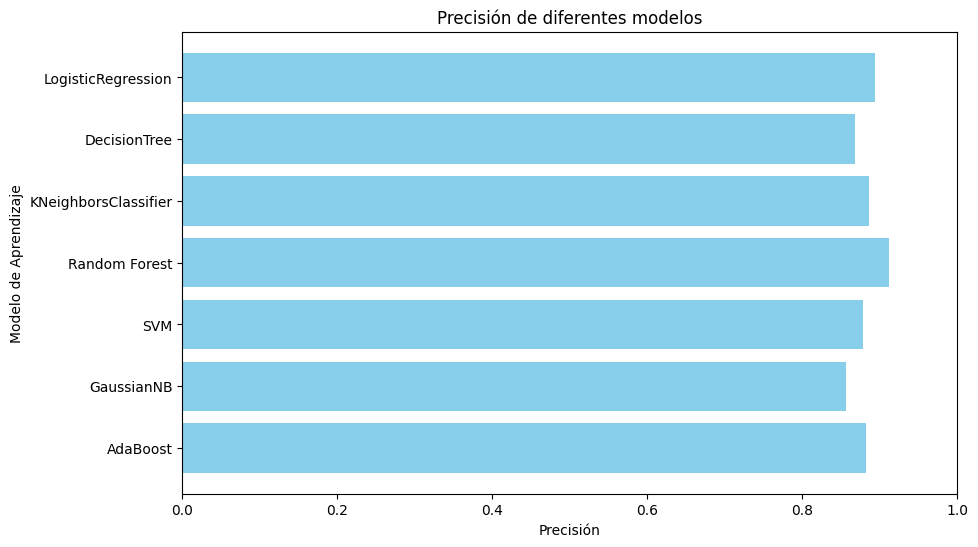

In [42]:
# @title Comparación de los Modelos

# Diccionario para almacenar precisiones
accuracies = {}

def compare_models(models, X_train, y_train, X_test, y_test):
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies[name] = accuracy
        # print(f"{name} Accuracy: {accuracy:.2f}")
        # print(classification_report(y_test, y_pred))
        # print("\n")

compare_models(models_2, X_train_2, y_train_2, X_test_2, y_test_2)

# Ordenar los modelos por precisión en orden descendente
sorted_models = dict(sorted(accuracies.items(), key=lambda x: x[1], reverse=True))

# Mostrar los modelos ordenados
for model_name, accuracy in sorted_models.items():
    print(f"{model_name}: {accuracy:.2f}")

# Create a bar plot for accuracies
plt.figure(figsize=(10, 6))
plt.barh(list(accuracies.keys()), list(accuracies.values()), color='skyblue')
plt.xlabel('Precisión')
plt.ylabel('Modelo de Aprendizaje')
plt.title('Precisión de diferentes modelos')
plt.xlim(0, 1)
plt.gca().invert_yaxis()
plt.show()

In [45]:
# @title Entrenamiento individual del modelo DecisionTree y prodicciones.

model_dt_2 = models_2['DecisionTree']

model_train_2 = model_dt_2.fit(X_train_2, y_train_2)

model_pred_dt_2 = model_train_2.predict(X_test_2)

In [46]:
# @title Desempeño del modelo de Arbol de decisión

print(classification_report(y_test_2, y_pred = model_pred_dt_2))

              precision    recall  f1-score   support

           0       0.94      0.91      0.92       238
           1       0.48      0.59      0.53        34

    accuracy                           0.87       272
   macro avg       0.71      0.75      0.72       272
weighted avg       0.88      0.87      0.87       272



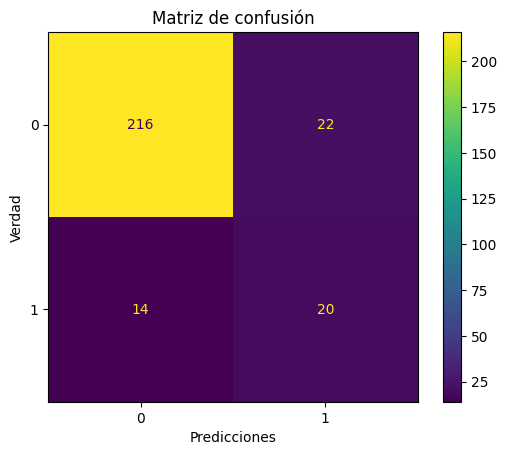

In [47]:
# @title Calcular la matriz de confusión con el modelo de Arbol de decisión

ConfusionMatrixDisplay(confusion_matrix(y_test_2, y_pred = model_pred_dt_2),
                       display_labels=model_dt_2.classes_).plot()
plt.title("Matriz de confusión")
plt.xlabel("Predicciones")
plt.ylabel("Verdad")
plt.show()

In [48]:
# @title Evaluacion del modelo Arbol de decisión con algunas metricas

# r2 = r2_score(y_test_2, model_pred_dt_2)
mse = mean_squared_error(y_test_2, model_pred_dt_2)
mae = mean_absolute_error(y_test_2, model_pred_dt_2)
rmse = np.sqrt(mean_squared_error(y_test_2, model_pred_dt_2))
vcross = cross_val_score(model_train_2, X_data_2, y_data_2, cv=KFold(5))

# print(f"Coeficiente de determinación R²: {r2}")
print(f"Error Cuadrático Medio (MSE): {mse:.2f}")
print(f"Error Absoluto Medio (MAE): {mae:.2f}")

print(f'El error cuadrático medio (RMSE) para el modelo en el primer paso es:: {rmse:.2f}')
print(f'La validación cruzada del modelo en el primer paso es: {vcross}')
print(f'La media de la validación cruzada del modelo en el primer paso es: {vcross.mean():.2f}')

Error Cuadrático Medio (MSE): 0.13
Error Absoluto Medio (MAE): 0.13
El error cuadrático medio (RMSE) para el modelo en el primer paso es:: 0.36
La validación cruzada del modelo en el primer paso es: [0.92647059 0.78308824 0.83088235 0.78308824 0.84132841]
La media de la validación cruzada del modelo en el primer paso es: 0.83


In [49]:
# @title Evaluacion del modelo Arbol de decisión con algunas metricas

accuracy = accuracy_score(y_test_2, model_pred_dt_2)
precision = precision_score(y_test_2, model_pred_dt_2)
recall = recall_score(y_test_2, model_pred_dt_2)
f1 = f1_score(y_test_2, model_pred_dt_2, average='weighted')

# Obtener probabilidades predichas en lugar de etiquetas de clase
y_probs_2 = model_train_2.predict_proba(X_test_2)

# Seleccionar las probabilidades para la clase positiva (asumiendo que es la clase 1)
# Si la clase positiva es diferente, ajusta el índice [:, 1] en consecuencia.
y_probs_positive_class = y_probs_2[:, 1]

# Calcular ROC AUC usando probabilidades de la clase positiva
roc_auc = roc_auc_score(y_test_2, y_probs_positive_class)


print(f'Exactitud: {accuracy:.2f}')
print(f'Precisión: {precision}')
print(f'Sensibilidad : {recall}')
print(f'F1 Score: {f1:.2f}')
print(f'ROC y AUC Score: {roc_auc}')

Exactitud: 0.87
Precisión: 0.47619047619047616
Sensibilidad : 0.5882352941176471
F1 Score: 0.87
ROC y AUC Score: 0.7478991596638656


<Figure size 1000x600 with 0 Axes>

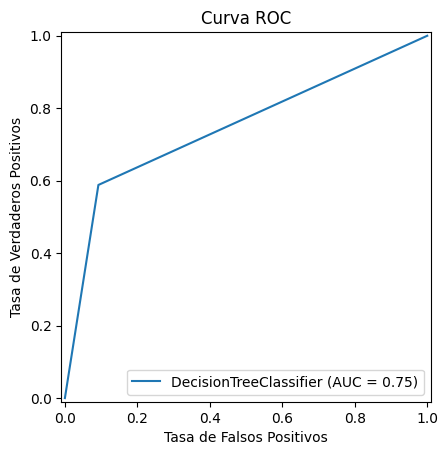

In [50]:
# @title Crear Curva ROC

from sklearn.metrics import RocCurveDisplay

# Matriz de Confusión: Muestra la cantidad de verdaderos positivos, negativos, falsos positivos y falsos negativos.
plt.figure(figsize=(10, 6))
RocCurveDisplay.from_estimator(model_train_2, X_test_2, y_test_2)
plt.title("Curva ROC")
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.show()

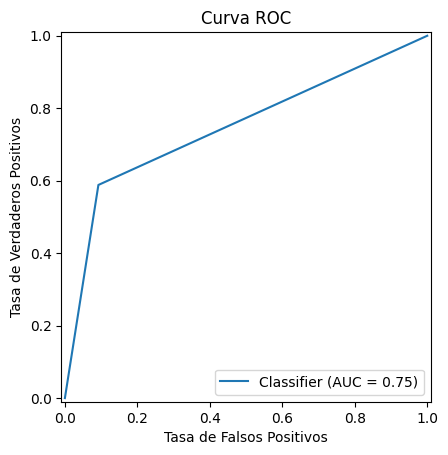

In [51]:
# @title Curva ROC

# ### Métricas:
#   - MSE, RMSE, precisión, recall, F1-score, matriz de confusión, curva ROC, AUC.
# ### Validación cruzada:
#   - K-fold, leave-one-out.
# Exactitud (Accuracy): Mide el porcentaje de predicciones correctas en relación con el total de predicciones.

# Precisión (Precision): Evalúa la proporción de verdaderos positivos sobre el total de predicciones positivas.

# Sensibilidad o Recall: Mide la capacidad del modelo para detectar todos los verdaderos positivos.

# F1 Score: Es la media armónica entre precisión y recall, útil cuando necesitas un balance entre ambas métricas.

# AUC-ROC: Representa la capacidad del modelo para distinguir entre clases. El área bajo la curva ROC es una buena métrica global de desempeño.

# Matriz de Confusión: Muestra la cantidad de verdaderos positivos, negativos, falsos positivos y falsos negativos.
RocCurveDisplay.from_predictions(y_test_2, model_pred_dt_2)
plt.title("Curva ROC")
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.show()

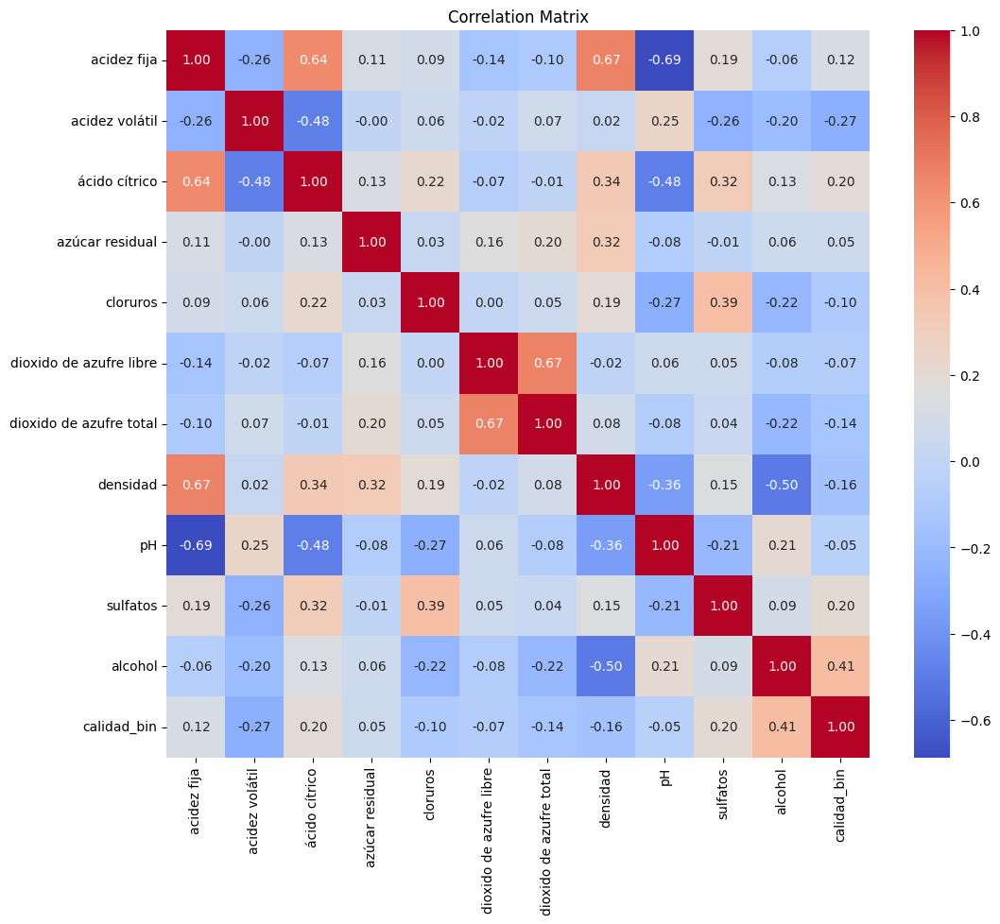

In [52]:
# @title Exploramos las correlaciones

plt.figure(figsize=(12,10))
corr_matrix = df_winequality_red_csv.corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

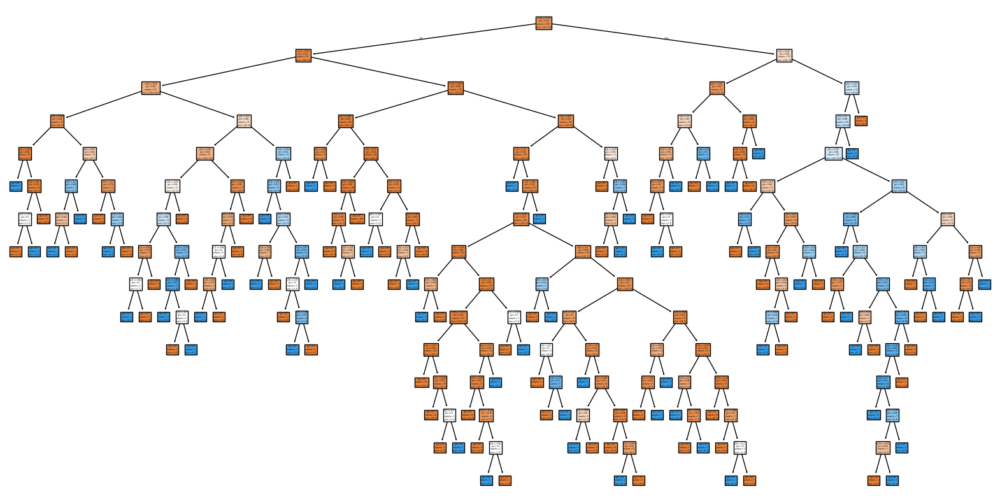

In [55]:
# @title Visualizar el árbol de decisión

from sklearn import tree

plt.figure(figsize=(20,10))
tree.plot_tree(model_train_2, filled=True)
plt.show()

#Evaluación de los Modelos entrenados

##Logistic Regression:
Exactitud del 0.89. Buen desempeño general, pero la precisión del 1 es baja.

##Decision Tree:
Exactitud del 0.87. Equilibrado, pero el f1-score del 1 es más bajo.

##KNeighborsClassifier:
Exactitud del 0.89. Similar a Logistic Regression, pero el f1-score del 1 es mejor.

##Random Forest:
Exactitud del 0.91. Mejor desempeño en general, especialmente en precisión y f1-score del 1.

##SVM:
Exactitud del 0.88. Alta precisión para la clase 0, pero muy baja para la clase 1.

##GaussianNB:
Exactitud del 0.86. Buen f1-score para la clase 0, pero un equilibrio extraño en precisión y recall del 1.

##AdaBoost:
Exactitud del 0.88. Desempeño equilibrado, pero precisión y recall del 1 son moderados.

#Árbol de decisión.

Con una precisión de 0.87, estamos viendo que el modelo tiene un buen rendimiento general. La precisión y el recall para la clase 0 son muy altos (0.94 y 0.91, respectivamente), lo que indica que el modelo es excelente para identificar correctamente la clase mayoritaria.

Sin embargo, para la clase 1, vemos que aunque la precisión es moderada (0.48), el recall es un poco más alto (0.59), lo que significa que el modelo está siendo capaz de identificar algunos casos positivos, pero aún le faltan algunos.

El f1-score de 0.53 para la clase 1 muestra que hay un equilibrio entre precisión y recall, pero todavía queda margen de mejora para la clase minoritaria.

##Evaluación del modelo Arbol de decisión con algunas metricas

Error Cuadrático Medio (MSE): 0.13

Error Absoluto Medio (MAE): 0.13

Error Cuadrático Medio (RMSE): 0.36

Validación Cruzada: Promedio de 0.83, con valores individuales entre 0.78 y 0.93

Estos resultados muestran que el modelo tiene una precisión razonable y es bastante robusto con respecto a la variabilidad en los datos. Mantener un MSE y un MAE bajos es excelente, ya que indica que los errores de predicción son pequeños en promedio.

##Modelo sólido segun los resultados de la evaluación:

Exactitud: 0.87

Precisión: 0.48

Sensibilidad (Recall): 0.59

F1 Score: 0.87

ROC y AUC Score: 0.75

Aunque la precisión es baja, el F1 Score y la AUC indican un rendimiento equilibrado.

## Curva ROC
Muestra la relación entre la Tasa de Falsos Positivos (FPR) y la Tasa de Verdaderos Positivos (TPR) para un modelo de árbol de decisión.

AUC (Área bajo la curva) = 0.75: Un AUC de 0.75 indica que el modelo tiene un desempeño moderado, mejor que el azar (AUC = 0.5), pero aún hay margen para mejorar.

##Matrix de correlacciones

###Correlaciones fuertes positivas:

La densidad está altamente correlacionada con acidez fija (0.67), lo que indica que al aumentar la acidez fija también tiende a aumentar la densidad.
Dióxido de azufre libre y dióxido de azufre total tienen una fuerte correlación (0.67), lo cual es esperable ya que ambos están relacionados químicamente.

###Correlaciones fuertes negativas:

El pH tiene una correlación negativa significativa con densidad (-0.50) y acidez fija (-0.69). Esto sugiere que a mayor acidez, menor es el pH, como es natural en disoluciones ácidas.

###Relación con la variable objetivo (calidad_bin):

La calidad binaria tiene correlaciones positivas moderadas con alcohol (0.41). Esto indica que el contenido de alcohol podría ser un buen predictor de la calidad en este contexto.
Por otro lado, tiene correlación negativa con acidez volátil (-0.27), lo que sugiere que una mayor acidez volátil podría asociarse con menor calidad.
Multicolinealidad: